# import packages

In [1]:
# scanpy packages 
import scanpy as sc
import scanpy.external as sce
import anndata as anndata

# Laughney packages
from anndata import AnnData
import time
import os
import numpy as np
import seaborn as sns
import pandas as pd

from colors import rgb, hex
import scipy.cluster.hierarchy as hc
import scipy as scipy
from scipy.stats import ttest_ind
from scipy.sparse import csr_matrix
import colors as colors

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
import matplotlib.colors as colors
import matplotlib.font_manager
from matplotlib import rcParams

%matplotlib inline

# other packages
import glob
from collections import OrderedDict
from scipy.sparse import csr_matrix
import scipy.stats
from statistics import median
from statistics import mean
from scanpy.external.pp import magic
from kneed import KneeLocator
import doubletdetection


In [2]:
# define colors

sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300, frameon=False, vector_friendly=True, fontsize=7, figsize=(10,10), color_map=None, format='pdf', facecolor=None, transparent=True, ipython_format='png2x')
sns.set_style('white')

color_map_clusters = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
"#FFDBE5", "#7A4900", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#FEFFE6", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

godsnot_64 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]

color_map_bimodal = ['#e1e1e1','#FF4A46']

color_map_clusters_plt = cm = LinearSegmentedColormap.from_list(
        'color_map_clusters', color_map_clusters)

# load RNAseq TCGA data

## load and clean data

In [39]:
TCGA = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/paad_tcga_pan_can_atlas_2018/data_RNA_Seq_v2_expression_median.txt', sep='\t', engine='python',header=[0])
meta_samples = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/paad_tcga_pan_can_atlas_2018/data_clinical_sample.txt', sep='\t', engine='python',header=[4])
meta_patients = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/paad_tcga_pan_can_atlas_2018/data_clinical_patient.txt', sep='\t', engine='python',header=[4])

In [40]:
TCGA

,Hugo_Symbol,Entrez_Gene_Id,TCGA-2J-AAB1-01,TCGA-2J-AAB4-01,TCGA-2J-AAB6-01,TCGA-2J-AAB8-01,TCGA-2J-AAB9-01,TCGA-2J-AABA-01,TCGA-2J-AABE-01,TCGA-2J-AABF-01,...,TCGA-XD-AAUG-01,TCGA-XD-AAUH-01,TCGA-XD-AAUI-01,TCGA-XD-AAUL-01,TCGA-XN-A8T3-01,TCGA-XN-A8T5-01,TCGA-YB-A89D-01,TCGA-YH-A8SY-01,TCGA-YY-A8LH-01,TCGA-Z5-AAPL-01
0,NaN,100130426,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000
1,NaN,100133144,8.5512,23.9941,1.7836,3.5159,1.0718,12.5881,6.2957,13.5235,...,11.8243,0.0000,4.7895,6.2661,13.2700,6.5912,4.6506,8.4755,6.3411,0.000
2,NaN,100134869,8.5220,8.8342,4.0643,15.2855,15.0054,27.4933,20.8355,13.4101,...,17.9054,5.2056,10.0693,13.6923,7.2996,10.6913,8.7102,4.3750,24.5265,11.396
3,NaN,10357,110.7710,81.9234,176.5910,95.2197,84.0622,67.7000,102.3710,119.5530,...,62.5541,80.3904,87.0332,131.9250,141.0920,81.4243,107.1940,101.8920,118.8890,146.838
4,NaN,10431,761.4630,715.0670,802.9240,1035.0200,886.3880,522.9370,598.7360,582.9720,...,480.4050,698.0740,775.1360,750.5200,749.4730,918.3550,583.7620,1206.7800,788.4470,600.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20526,ZYG11A,440590,0.0000,0.0000,0.5848,3.7603,1.0718,1.2525,0.6166,1.0632,...,0.0000,0.0000,3.4671,0.0000,0.5274,1.7878,0.0000,0.5841,0.0000,8.547
20527,ZYG11B,79699,573.1710,646.4650,683.6260,680.6110,646.3020,945.6710,564.2050,719.7660,...,810.1350,826.6530,602.7740,709.3560,733.6500,687.7230,749.7430,606.3080,320.1410,699.715
20528,ZYX,7791,7724.3900,5563.5500,11696.5000,5829.3800,8094.3200,4829.8100,7464.7800,6087.7100,...,7697.9700,5460.1800,6202.5800,11670.7000,5864.4500,6786.0500,8877.7000,9511.6800,5101.5300,4975.500
20529,ZZEF1,23140,1078.0500,904.0400,869.0060,828.2020,1083.6000,1364.6500,832.4340,1521.7500,...,1117.5700,1508.5900,986.6270,922.2450,1261.0800,1327.7700,943.9880,880.2570,800.7940,1871.790


In [47]:
meta_samples = meta_samples.set_index('SAMPLE_ID')
meta_samples

,ONCOTREE_CODE,CANCER_TYPE,CANCER_TYPE_DETAILED,TUMOR_TYPE,GRADE,TISSUE_PROSPECTIVE_COLLECTION_INDICATOR,TISSUE_RETROSPECTIVE_COLLECTION_INDICATOR,TISSUE_SOURCE_SITE,TUMOR_TISSUE_SITE,ANEUPLOIDY_SCORE,...,STATUS_19P,STATUS_19Q,STATUS_20P,STATUS_20Q,STATUS_21_21Q,STATUS_22_22Q,SAMPLE_TYPE,MSI_SCORE_MANTIS,MSI_SENSOR_SCORE,SOMATIC_STATUS
SAMPLE_ID,,,,,,,,,,,,,,,,,,,,,
TCGA-2J-AAB1-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Other Subtype",G3,No,Yes,2J,Pancreas,2.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2792,1.42,Matched
TCGA-2J-AAB4-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Other Subtype",G2,No,Yes,2J,Pancreas,6.0,...,Not Called,NaN,Not Called,Not Called,Not Called,Not Called,Primary,0.2835,0.23,Matched
TCGA-2J-AAB6-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G2,No,Yes,2J,Pancreas,13.0,...,Not Called,Gained,NaN,Gained,Not Called,Not Called,Primary,0.2974,0.72,Matched
TCGA-2J-AAB8-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G3,No,Yes,2J,Pancreas,9.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2788,1.01,Matched
TCGA-2J-AAB9-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G1,No,Yes,2J,Pancreas,0.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2722,0.51,Matched
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-XN-A8T5-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Other Subtype",G2,No,Yes,XN,Pancreas,0.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2751,0.46,Matched
TCGA-YB-A89D-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G2,Yes,No,YB,Pancreas,21.0,...,Gained,Gained,Gained,Gained,Lost,Lost,Primary,0.2940,0.59,Matched
TCGA-YH-A8SY-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,G2,No,Yes,YH,Pancreas,7.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.3002,0.43,Matched


In [42]:
meta_patients = meta_patients.set_index('PATIENT_ID')
meta_patients

,SUBTYPE,CANCER_TYPE_ACRONYM,OTHER_PATIENT_ID,AGE,SEX,AJCC_PATHOLOGIC_TUMOR_STAGE,AJCC_STAGING_EDITION,DAYS_LAST_FOLLOWUP,DAYS_TO_BIRTH,DAYS_TO_INITIAL_PATHOLOGIC_DIAGNOSIS,...,CENTER,IN_PANCANPATHWAYS_FREEZE,OS_STATUS,OS_MONTHS,DSS_STATUS,DSS_MONTHS,DFS_STATUS,DFS_MONTHS,PFS_STATUS,PFS_MONTHS
PATIENT_ID,,,,,,,,,,,,,,,,,,,,,
TCGA-2J-AAB1,PAAD,PAAD,75119D1A-93E5-4AE7-9D60-69EE929A0772,65,Male,STAGE IIB,7TH,NaN,-23962,0.0,...,Mayo Clinic,Yes,1:DECEASED,2.169839,1:DEAD WITH TUMOR,2.169839,0:DiseaseFree,2.169839,0:CENSORED,2.169839
TCGA-2J-AAB4,PAAD,PAAD,33833131-1482-42D5-9CF5-01CADE540234,48,Male,STAGE IIB,7TH,729.0,-17794,0.0,...,Mayo Clinic,Yes,0:LIVING,23.966861,0:ALIVE OR DEAD TUMOR FREE,23.966861,0:DiseaseFree,23.966861,0:CENSORED,23.966861
TCGA-2J-AAB6,PAAD,PAAD,70797499-16E6-48CC-8AE4-1E692713DAD3,75,Male,STAGE IIA,7TH,NaN,-27600,0.0,...,Mayo Clinic,Yes,1:DECEASED,9.632771,1:DEAD WITH TUMOR,9.632771,NaN,NaN,1:PROGRESSION,5.556103
TCGA-2J-AAB8,PAAD,PAAD,2E8F90F4-AED3-43B0-985C-DFDC2581F24F,71,Male,STAGE IIB,7TH,80.0,-26028,0.0,...,Mayo Clinic,Yes,0:LIVING,2.630108,0:ALIVE OR DEAD TUMOR FREE,2.630108,NaN,NaN,0:CENSORED,2.630108
TCGA-2J-AAB9,PAAD,PAAD,A5748656-5330-417A-8938-01F69DDB3576,70,Female,STAGE IIB,7TH,NaN,-25920,0.0,...,Mayo Clinic,Yes,1:DECEASED,20.613473,1:DEAD WITH TUMOR,20.613473,1:Recurred/Progressed,17.128579,1:PROGRESSION,17.128579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-XN-A8T5,PAAD,PAAD,382B279F-87E1-4DBC-A2CA-C1DFDE1CF254,53,Female,STAGE IB,7TH,720.0,-19707,0.0,...,University of Sao Paulo,Yes,0:LIVING,23.670973,0:ALIVE OR DEAD TUMOR FREE,23.670973,NaN,NaN,1:PROGRESSION,7.956077
TCGA-YB-A89D,PAAD,PAAD,B84B58C7-95B8-4162-8E61-414F8FE422C6,59,Male,STAGE IIB,7TH,350.0,-21792,0.0,...,Spectrum Health,Yes,0:LIVING,11.506723,0:ALIVE OR DEAD TUMOR FREE,11.506723,0:DiseaseFree,11.506723,0:CENSORED,11.506723
TCGA-YH-A8SY,PAAD,PAAD,503D7E36-DF78-428D-9971-09FF707645C2,73,Female,STAGE III,7TH,388.0,-26859,0.0,...,Stanford University,Yes,0:LIVING,12.756025,0:ALIVE OR DEAD TUMOR FREE,12.756025,NaN,NaN,0:CENSORED,12.756025


In [43]:
TCGA_no_nan = TCGA[~TCGA['Hugo_Symbol'].isna()]
TCGA_no_nan = TCGA_no_nan.set_index('Hugo_Symbol')
TCGA_no_nan

,Entrez_Gene_Id,TCGA-2J-AAB1-01,TCGA-2J-AAB4-01,TCGA-2J-AAB6-01,TCGA-2J-AAB8-01,TCGA-2J-AAB9-01,TCGA-2J-AABA-01,TCGA-2J-AABE-01,TCGA-2J-AABF-01,TCGA-2J-AABH-01,...,TCGA-XD-AAUG-01,TCGA-XD-AAUH-01,TCGA-XD-AAUI-01,TCGA-XD-AAUL-01,TCGA-XN-A8T3-01,TCGA-XN-A8T5-01,TCGA-YB-A89D-01,TCGA-YH-A8SY-01,TCGA-YY-A8LH-01,TCGA-Z5-AAPL-01
Hugo_Symbol,,,,,,,,,,,,,,,,,,,,,
A1BG,1,81.9122,56.7551,82.5497,56.9307,105.7880,99.3455,79.4019,92.7368,52.5740,...,192.9730,135.0490,141.4960,101.9750,132.0250,122.8430,156.8860,239.3870,65.8274,120.8770
A1CF,29974,25.3659,53.4512,8.1871,33.8425,21.4362,18.7882,3.0831,112.3420,62.2822,...,43.2432,42.6861,85.6860,89.3971,21.0970,9.5352,73.9979,2.3364,29.9857,3.9886
A2BP1,54715,0.4878,2.1044,0.0000,0.0000,1.0718,0.0000,0.0000,3.1895,1.3066,...,2.0270,10.9318,2.4765,0.8316,0.0000,4.1716,1.0277,0.0000,3.9687,0.0000
A2LD1,87769,180.4980,111.0770,163.1230,185.8140,166.7090,99.2767,134.5650,112.9760,261.8770,...,66.6216,88.4279,158.4200,67.4304,104.5200,89.0226,104.0900,87.4533,120.9530,106.7750
A2M,2,19703.8000,15837.8000,8517.4400,14413.9000,24311.8000,10302.0000,11076.9000,18795.9000,14776.9000,...,27767.4000,23815.5000,20787.3000,22677.7000,18811.6000,20203.6000,23524.6000,8438.5500,4471.2800,10193.7000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,440590,0.0000,0.0000,0.5848,3.7603,1.0718,1.2525,0.6166,1.0632,0.4355,...,0.0000,0.0000,3.4671,0.0000,0.5274,1.7878,0.0000,0.5841,0.0000,8.5470
ZYG11B,79699,573.1710,646.4650,683.6260,680.6110,646.3020,945.6710,564.2050,719.7660,483.8850,...,810.1350,826.6530,602.7740,709.3560,733.6500,687.7230,749.7430,606.3080,320.1410,699.7150
ZYX,7791,7724.3900,5563.5500,11696.5000,5829.3800,8094.3200,4829.8100,7464.7800,6087.7100,6779.1800,...,7697.9700,5460.1800,6202.5800,11670.7000,5864.4500,6786.0500,8877.7000,9511.6800,5101.5300,4975.5000


## select primary tumors

In [49]:
meta_samples.columns

Index(['ONCOTREE_CODE', 'CANCER_TYPE', 'CANCER_TYPE_DETAILED', 'TUMOR_TYPE',
       'GRADE', 'TISSUE_PROSPECTIVE_COLLECTION_INDICATOR',
       'TISSUE_RETROSPECTIVE_COLLECTION_INDICATOR', 'TISSUE_SOURCE_SITE',
       'TUMOR_TISSUE_SITE', 'ANEUPLOIDY_SCORE', 'STATUS_1P', 'STATUS_1Q',
       'STATUS_2P', 'STATUS_2Q', 'STATUS_3P', 'STATUS_3Q', 'STATUS_4P',
       'STATUS_4Q', 'STATUS_5P', 'STATUS_5Q', 'STATUS_6P', 'STATUS_6Q',
       'STATUS_7P', 'STATUS_7Q', 'STATUS_8P', 'STATUS_8Q', 'STATUS_9P',
       'STATUS_9Q', 'STATUS_10P', 'STATUS_10Q', 'STATUS_11P', 'STATUS_11Q',
       'STATUS_12P', 'STATUS_12Q', 'STATUS_13_13Q', 'STATUS_14_14Q',
       'STATUS_15_15Q', 'STATUS_16P', 'STATUS_16Q', 'STATUS_17P', 'STATUS_17Q',
       'STATUS_18P', 'STATUS_18Q', 'STATUS_19P', 'STATUS_19Q', 'STATUS_20P',
       'STATUS_20Q', 'STATUS_21_21Q', 'STATUS_22_22Q', 'SAMPLE_TYPE',
       'MSI_SCORE_MANTIS', 'MSI_SENSOR_SCORE', 'SOMATIC_STATUS'],
      dtype='object')

In [64]:
set(meta_patients.index).intersection(set(meta_samples.index.str.slice(start=0, stop=-3)))

{'TCGA-2J-AAB1',
 'TCGA-2J-AAB4',
 'TCGA-2J-AAB6',
 'TCGA-2J-AAB8',
 'TCGA-2J-AAB9',
 'TCGA-2J-AABA',
 'TCGA-2J-AABE',
 'TCGA-2J-AABF',
 'TCGA-2J-AABH',
 'TCGA-2J-AABI',
 'TCGA-2J-AABK',
 'TCGA-2J-AABO',
 'TCGA-2J-AABP',
 'TCGA-2J-AABR',
 'TCGA-2J-AABT',
 'TCGA-2J-AABU',
 'TCGA-2J-AABV',
 'TCGA-2L-AAQA',
 'TCGA-2L-AAQE',
 'TCGA-2L-AAQI',
 'TCGA-2L-AAQJ',
 'TCGA-2L-AAQL',
 'TCGA-2L-AAQM',
 'TCGA-3A-A9I5',
 'TCGA-3A-A9I7',
 'TCGA-3A-A9I9',
 'TCGA-3A-A9IB',
 'TCGA-3A-A9IC',
 'TCGA-3A-A9IH',
 'TCGA-3A-A9IJ',
 'TCGA-3A-A9IL',
 'TCGA-3A-A9IN',
 'TCGA-3A-A9IO',
 'TCGA-3A-A9IR',
 'TCGA-3A-A9IS',
 'TCGA-3A-A9IU',
 'TCGA-3A-A9IV',
 'TCGA-3A-A9IX',
 'TCGA-3A-A9IZ',
 'TCGA-3A-A9J0',
 'TCGA-3E-AAAY',
 'TCGA-3E-AAAZ',
 'TCGA-F2-6879',
 'TCGA-F2-6880',
 'TCGA-F2-7273',
 'TCGA-F2-7276',
 'TCGA-F2-A44G',
 'TCGA-F2-A44H',
 'TCGA-F2-A7TX',
 'TCGA-F2-A8YN',
 'TCGA-FB-A4P5',
 'TCGA-FB-A4P6',
 'TCGA-FB-A545',
 'TCGA-FB-A5VM',
 'TCGA-FB-A78T',
 'TCGA-FB-A7DR',
 'TCGA-FB-AAPP',
 'TCGA-FB-AAPQ',
 'TCGA-FB-AAPS

In [48]:
meta_samples_primary = meta_samples[meta_samples['SAMPLE_TYPE']=='Primary']
meta_samples_primary

,ONCOTREE_CODE,CANCER_TYPE,CANCER_TYPE_DETAILED,TUMOR_TYPE,GRADE,TISSUE_PROSPECTIVE_COLLECTION_INDICATOR,TISSUE_RETROSPECTIVE_COLLECTION_INDICATOR,TISSUE_SOURCE_SITE,TUMOR_TISSUE_SITE,ANEUPLOIDY_SCORE,...,STATUS_19P,STATUS_19Q,STATUS_20P,STATUS_20Q,STATUS_21_21Q,STATUS_22_22Q,SAMPLE_TYPE,MSI_SCORE_MANTIS,MSI_SENSOR_SCORE,SOMATIC_STATUS
SAMPLE_ID,,,,,,,,,,,,,,,,,,,,,
TCGA-2J-AAB1-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Other Subtype",G3,No,Yes,2J,Pancreas,2.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2792,1.42,Matched
TCGA-2J-AAB4-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Other Subtype",G2,No,Yes,2J,Pancreas,6.0,...,Not Called,NaN,Not Called,Not Called,Not Called,Not Called,Primary,0.2835,0.23,Matched
TCGA-2J-AAB6-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G2,No,Yes,2J,Pancreas,13.0,...,Not Called,Gained,NaN,Gained,Not Called,Not Called,Primary,0.2974,0.72,Matched
TCGA-2J-AAB8-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G3,No,Yes,2J,Pancreas,9.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2788,1.01,Matched
TCGA-2J-AAB9-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G1,No,Yes,2J,Pancreas,0.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2722,0.51,Matched
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-XN-A8T5-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Other Subtype",G2,No,Yes,XN,Pancreas,0.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.2751,0.46,Matched
TCGA-YB-A89D-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,"Pancreas Adenocarcinoma, Ductal Type",G2,Yes,No,YB,Pancreas,21.0,...,Gained,Gained,Gained,Gained,Lost,Lost,Primary,0.2940,0.59,Matched
TCGA-YH-A8SY-01,PAAD,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,Pancreatic Adenocarcinoma,G2,No,Yes,YH,Pancreas,7.0,...,Not Called,Not Called,Not Called,Not Called,Not Called,Not Called,Primary,0.3002,0.43,Matched


In [66]:
#test if only one primary tumor sample per patients (comparing intersection of primary tumor samples and patients with primary tumor samples)
print('sample list only contains one primary tumor per patient:',len(set(meta_samples_primary.index)) == len(set(meta_patients.index).intersection(set(meta_samples_primary.index.str.slice(start=0, stop=-3)))))

sample list only contains one primary tumor per patient: True


In [67]:
meta_samples_primary_list = list(meta_samples_primary.index)
meta_samples_primary_list

['TCGA-2J-AAB1-01',
 'TCGA-2J-AAB4-01',
 'TCGA-2J-AAB6-01',
 'TCGA-2J-AAB8-01',
 'TCGA-2J-AAB9-01',
 'TCGA-2J-AABA-01',
 'TCGA-2J-AABE-01',
 'TCGA-2J-AABF-01',
 'TCGA-2J-AABH-01',
 'TCGA-2J-AABI-01',
 'TCGA-2J-AABK-01',
 'TCGA-2J-AABO-01',
 'TCGA-2J-AABP-01',
 'TCGA-2J-AABR-01',
 'TCGA-2J-AABT-01',
 'TCGA-2J-AABU-01',
 'TCGA-2J-AABV-01',
 'TCGA-2L-AAQA-01',
 'TCGA-2L-AAQE-01',
 'TCGA-2L-AAQI-01',
 'TCGA-2L-AAQJ-01',
 'TCGA-2L-AAQL-01',
 'TCGA-2L-AAQM-01',
 'TCGA-3A-A9I5-01',
 'TCGA-3A-A9I7-01',
 'TCGA-3A-A9I9-01',
 'TCGA-3A-A9IB-01',
 'TCGA-3A-A9IC-01',
 'TCGA-3A-A9IH-01',
 'TCGA-3A-A9IJ-01',
 'TCGA-3A-A9IL-01',
 'TCGA-3A-A9IN-01',
 'TCGA-3A-A9IO-01',
 'TCGA-3A-A9IR-01',
 'TCGA-3A-A9IS-01',
 'TCGA-3A-A9IU-01',
 'TCGA-3A-A9IV-01',
 'TCGA-3A-A9IX-01',
 'TCGA-3A-A9IZ-01',
 'TCGA-3A-A9J0-01',
 'TCGA-3E-AAAY-01',
 'TCGA-3E-AAAZ-01',
 'TCGA-F2-6879-01',
 'TCGA-F2-6880-01',
 'TCGA-F2-7273-01',
 'TCGA-F2-7276-01',
 'TCGA-F2-A44G-01',
 'TCGA-F2-A44H-01',
 'TCGA-F2-A7TX-01',
 'TCGA-F2-A8YN-01',


In [80]:
#intersect with indices of TCGA df

final_sample_ID = list(set(meta_samples_primary_list).intersection(set(TCGA_no_nan.columns)))
final_sample_ID

['TCGA-2J-AABI-01',
 'TCGA-IB-7886-01',
 'TCGA-F2-6880-01',
 'TCGA-2J-AAB9-01',
 'TCGA-FB-A4P6-01',
 'TCGA-2L-AAQE-01',
 'TCGA-F2-7273-01',
 'TCGA-FB-AAPU-01',
 'TCGA-US-A776-01',
 'TCGA-2L-AAQA-01',
 'TCGA-IB-7645-01',
 'TCGA-F2-A8YN-01',
 'TCGA-3A-A9IB-01',
 'TCGA-L1-A7W4-01',
 'TCGA-HZ-8636-01',
 'TCGA-Q3-A5QY-01',
 'TCGA-Q3-AA2A-01',
 'TCGA-HZ-A4BH-01',
 'TCGA-HZ-7926-01',
 'TCGA-IB-AAUP-01',
 'TCGA-3E-AAAY-01',
 'TCGA-2J-AAB6-01',
 'TCGA-HZ-A4BK-01',
 'TCGA-IB-AAUM-01',
 'TCGA-S4-A8RP-01',
 'TCGA-FB-AAPY-01',
 'TCGA-3A-A9IX-01',
 'TCGA-IB-AAUQ-01',
 'TCGA-S4-A8RO-01',
 'TCGA-3A-A9IZ-01',
 'TCGA-2J-AABF-01',
 'TCGA-F2-A44G-01',
 'TCGA-3A-A9IU-01',
 'TCGA-HZ-A9TJ-01',
 'TCGA-IB-8126-01',
 'TCGA-IB-A5SP-01',
 'TCGA-2J-AABK-01',
 'TCGA-2J-AABR-01',
 'TCGA-F2-6879-01',
 'TCGA-HV-A5A5-01',
 'TCGA-HZ-7918-01',
 'TCGA-M8-A5N4-01',
 'TCGA-HV-A5A3-01',
 'TCGA-3A-A9I9-01',
 'TCGA-2J-AAB1-01',
 'TCGA-LB-A7SX-01',
 'TCGA-FB-AAPP-01',
 'TCGA-IB-AAUW-01',
 'TCGA-HV-A5A6-01',
 'TCGA-PZ-A5RE-01',


In [82]:
#select gene expression data for primary samples 
TCGA_no_nan_primary = TCGA_no_nan.loc[:,final_sample_ID]
TCGA_no_nan_primary

,TCGA-2J-AABI-01,TCGA-IB-7886-01,TCGA-F2-6880-01,TCGA-2J-AAB9-01,TCGA-FB-A4P6-01,TCGA-2L-AAQE-01,TCGA-F2-7273-01,TCGA-FB-AAPU-01,TCGA-US-A776-01,TCGA-2L-AAQA-01,...,TCGA-HV-A7OP-01,TCGA-XN-A8T3-01,TCGA-IB-A6UG-01,TCGA-IB-AAUT-01,TCGA-2J-AABO-01,TCGA-IB-7647-01,TCGA-FB-A4P5-01,TCGA-RB-A7B8-01,TCGA-FB-AAPZ-01,TCGA-IB-7649-01
Hugo_Symbol,,,,,,,,,,,,,,,,,,,,,
A1BG,76.3316,19.1257,72.2307,105.7880,84.0395,124.1750,76.5828,29.6613,25.8795,65.1036,...,61.2870,132.0250,61.0117,166.2260,61.4904,24.0460,191.4940,172.1980,44.5764,38.1212
A1CF,0.0000,108.1160,181.6510,21.4362,178.4740,2.3170,209.7140,176.0900,128.8580,38.2063,...,2.0429,21.0970,15.0301,121.4120,24.8397,25.6142,15.9797,55.5556,28.2404,100.7490
A2BP1,0.3628,0.0000,1.2274,1.0718,0.6812,0.9268,4.5243,1.5018,98.9711,0.0000,...,8.1716,0.0000,0.5368,13.1579,1.6026,0.7841,1.4527,0.5974,0.0000,4.7651
A2LD1,56.9993,111.1110,486.8370,166.7090,87.1049,82.8684,61.0193,209.3260,104.0080,337.1000,...,622.1040,104.5200,140.4780,103.8820,205.3370,85.5985,105.7270,128.2560,69.7610,118.2980
A2M,3769.4700,16527.8000,17341.2000,24311.8000,20171.7000,7511.9800,47982.1000,6172.8800,2867.1700,5689.0700,...,4133.4400,18811.6000,8214.8900,30072.8000,24191.5000,26164.3000,20623.9000,17289.4000,18055.7000,37908.4000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,3.9913,0.0000,1.2274,1.0718,1.3624,0.4634,0.2661,0.3755,16.1685,0.0000,...,2.0429,0.5274,2.1472,1.1962,0.0000,2.0910,5.0844,0.0000,0.0000,0.6807
ZYG11B,321.1180,759.4520,656.6430,646.3020,836.5120,658.0170,1185.1000,607.4930,412.5430,416.6500,...,259.4480,733.6500,465.9350,723.0860,596.1540,985.8860,662.4300,652.3300,680.6660,915.5890
ZYX,5757.2600,5001.2300,1744.0900,8094.3200,4918.2600,6195.0900,5156.6200,5116.0100,3488.9800,6958.7800,...,4684.3700,5864.4500,4083.3700,5909.0900,7125.0000,3550.9700,7442.1600,9999.4000,4830.5600,3698.4300


In [84]:
TCGA_no_nan_primary.to_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/paad_tcga_pan_can_atlas_2018/data_RNA_Seq_v2_expression_median_primary_only_clean.gct')

# single sample GSEA

In [273]:
#set variables
csv_save_path = '/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/TCGA_CD56dim_scores_ssGSEA_with_metadata.csv'
gene_set_path = "/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/CD56dim_sig_5_top_10.gmt"

In [274]:
import gseapy as gp

In [275]:
ss = gp.ssgsea(data=TCGA_no_nan_primary,
               gene_sets= gene_set_path,
               outdir='test/ssgsea_report',
               sample_norm_method='rank', # choose 'custom' for your own rank list
               permutation_num=0, # skip permutation procedure, because you don't need it
               no_plot=True, # skip plotting, because you don't need these figures
               processes=4, format='png', seed=9,min_size=5)

2021-02-08 21:26:24,985 Warning: dropping duplicated gene names, only keep the first values


In [276]:
ss.res2d.sort_index().head()

,TCGA-2J-AABI-01,TCGA-IB-7886-01,TCGA-F2-6880-01,TCGA-2J-AAB9-01,TCGA-FB-A4P6-01,TCGA-2L-AAQE-01,TCGA-F2-7273-01,TCGA-FB-AAPU-01,TCGA-US-A776-01,TCGA-2L-AAQA-01,...,TCGA-HV-A7OP-01,TCGA-XN-A8T3-01,TCGA-IB-A6UG-01,TCGA-IB-AAUT-01,TCGA-2J-AABO-01,TCGA-IB-7647-01,TCGA-FB-A4P5-01,TCGA-RB-A7B8-01,TCGA-FB-AAPZ-01,TCGA-IB-7649-01
Term|NES,,,,,,,,,,,,,,,,,,,,,
CD56dim_sig_PAAD,-3.550265,-3.100673,-3.026715,-3.219046,-3.162673,-3.229367,-3.055115,-3.483498,-3.070112,-3.218525,...,-3.069439,-3.366551,-3.261547,-3.055699,-3.445074,-3.056475,-3.220978,-2.912409,-3.113137,-2.942943


## add patient metadata

In [277]:
GSEA_result = ss.res2d.sort_index()
GSEA_result = GSEA_result.transpose()
GSEA_result.index = GSEA_result.index.str.slice(start=0, stop=-3)
GSEA_result

Term|NES,CD56dim_sig_PAAD
TCGA-2J-AABI,-3.550265
TCGA-IB-7886,-3.100673
TCGA-F2-6880,-3.026715
TCGA-2J-AAB9,-3.219046
TCGA-FB-A4P6,-3.162673
...,...
TCGA-IB-7647,-3.056475
TCGA-FB-A4P5,-3.220978
TCGA-RB-A7B8,-2.912409
TCGA-FB-AAPZ,-3.113137


In [278]:
meta_patients.columns

Index(['SUBTYPE', 'CANCER_TYPE_ACRONYM', 'OTHER_PATIENT_ID', 'AGE', 'SEX',
       'AJCC_PATHOLOGIC_TUMOR_STAGE', 'AJCC_STAGING_EDITION',
       'DAYS_LAST_FOLLOWUP', 'DAYS_TO_BIRTH',
       'DAYS_TO_INITIAL_PATHOLOGIC_DIAGNOSIS', 'ETHNICITY',
       'FORM_COMPLETION_DATE', 'HISTORY_NEOADJUVANT_TRTYN', 'ICD_10',
       'ICD_O_3_HISTOLOGY', 'ICD_O_3_SITE', 'INFORMED_CONSENT_VERIFIED',
       'NEW_TUMOR_EVENT_AFTER_INITIAL_TREATMENT', 'PATH_M_STAGE',
       'PATH_N_STAGE', 'PATH_T_STAGE', 'PERSON_NEOPLASM_CANCER_STATUS',
       'PRIMARY_LYMPH_NODE_PRESENTATION_ASSESSMENT', 'PRIOR_DX', 'RACE',
       'RADIATION_THERAPY', 'WEIGHT', 'CENTER', 'IN_PANCANPATHWAYS_FREEZE',
       'OS_STATUS', 'OS_MONTHS', 'DSS_STATUS', 'DSS_MONTHS', 'DFS_STATUS',
       'DFS_MONTHS', 'PFS_STATUS', 'PFS_MONTHS'],
      dtype='object')

In [279]:
meta_patients_select = meta_patients.loc[:,['AGE', 'SEX',
       'AJCC_PATHOLOGIC_TUMOR_STAGE',
       'DAYS_LAST_FOLLOWUP', 
       'RADIATION_THERAPY',
       'OS_STATUS', 'OS_MONTHS']]
meta_patients_select

,AGE,SEX,AJCC_PATHOLOGIC_TUMOR_STAGE,DAYS_LAST_FOLLOWUP,RADIATION_THERAPY,OS_STATUS,OS_MONTHS
PATIENT_ID,,,,,,,
TCGA-2J-AAB1,65,Male,STAGE IIB,NaN,No,1:DECEASED,2.169839
TCGA-2J-AAB4,48,Male,STAGE IIB,729.0,No,0:LIVING,23.966861
TCGA-2J-AAB6,75,Male,STAGE IIA,NaN,No,1:DECEASED,9.632771
TCGA-2J-AAB8,71,Male,STAGE IIB,80.0,NaN,0:LIVING,2.630108
TCGA-2J-AAB9,70,Female,STAGE IIB,NaN,Yes,1:DECEASED,20.613473
...,...,...,...,...,...,...,...
TCGA-XN-A8T5,53,Female,STAGE IB,720.0,Yes,0:LIVING,23.670973
TCGA-YB-A89D,59,Male,STAGE IIB,350.0,Yes,0:LIVING,11.506723
TCGA-YH-A8SY,73,Female,STAGE III,388.0,Yes,0:LIVING,12.756025


In [280]:
GSEA_result_meta = pd.concat([GSEA_result['CD56dim_sig_PAAD'],meta_patients_select],axis=1)
GSEA_result_meta = GSEA_result_meta[~GSEA_result_meta['CD56dim_sig_PAAD'].isna()]
GSEA_result_meta

,CD56dim_sig_PAAD,AGE,SEX,AJCC_PATHOLOGIC_TUMOR_STAGE,DAYS_LAST_FOLLOWUP,RADIATION_THERAPY,OS_STATUS,OS_MONTHS
TCGA-2J-AABI,-3.550265,55,Female,STAGE IIA,969.0,Yes,0:LIVING,31.857185
TCGA-IB-7886,-3.100673,80,Male,STAGE IIB,NaN,No,1:DECEASED,4.043791
TCGA-F2-6880,-3.026715,70,Male,STAGE IIB,289.0,No,0:LIVING,9.698524
TCGA-2J-AAB9,-3.219046,70,Female,STAGE IIB,NaN,Yes,1:DECEASED,20.613473
TCGA-FB-A4P6,-3.162673,54,Male,STAGE IIB,767.0,Yes,0:LIVING,25.216162
...,...,...,...,...,...,...,...,...
TCGA-IB-7647,-3.056475,41,Male,STAGE IIB,NaN,No,1:DECEASED,21.895650
TCGA-FB-A4P5,-3.220978,69,Female,STAGE IIB,4.0,NaN,1:DECEASED,5.884867
TCGA-RB-A7B8,-2.912409,81,Female,STAGE IIB,36.0,No,1:DECEASED,15.320380
TCGA-FB-AAPZ,-3.113137,54,Male,STAGE IIB,716.0,No,0:LIVING,23.539468


In [281]:
#save data
GSEA_result_meta.to_csv(csv_save_path)
print('save to', csv_save_path)

save to /home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/TCGA_CD56dim_scores_ssGSEA_with_metadata.csv


# Survival analysis

In [282]:
df_path = '/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/TCGA_CD56dim_scores_ssGSEA_with_metadata.csv'

In [283]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter

In [284]:
GSEA_result_meta = pd.read_csv(df_path, index_col='Unnamed: 0')
GSEA_result_meta

,CD56dim_sig_PAAD,AGE,SEX,AJCC_PATHOLOGIC_TUMOR_STAGE,DAYS_LAST_FOLLOWUP,RADIATION_THERAPY,OS_STATUS,OS_MONTHS
TCGA-2J-AABI,-3.550265,55,Female,STAGE IIA,969.0,Yes,0:LIVING,31.857185
TCGA-IB-7886,-3.100673,80,Male,STAGE IIB,NaN,No,1:DECEASED,4.043791
TCGA-F2-6880,-3.026715,70,Male,STAGE IIB,289.0,No,0:LIVING,9.698524
TCGA-2J-AAB9,-3.219046,70,Female,STAGE IIB,NaN,Yes,1:DECEASED,20.613473
TCGA-FB-A4P6,-3.162673,54,Male,STAGE IIB,767.0,Yes,0:LIVING,25.216162
...,...,...,...,...,...,...,...,...
TCGA-IB-7647,-3.056475,41,Male,STAGE IIB,NaN,No,1:DECEASED,21.895650
TCGA-FB-A4P5,-3.220978,69,Female,STAGE IIB,4.0,NaN,1:DECEASED,5.884867
TCGA-RB-A7B8,-2.912409,81,Female,STAGE IIB,36.0,No,1:DECEASED,15.320380
TCGA-FB-AAPZ,-3.113137,54,Male,STAGE IIB,716.0,No,0:LIVING,23.539468


In [285]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [286]:
#change OS status to 0 1

OS_dict = {'0:LIVING':0, '1:DECEASED':1}

GSEA_result_meta['OS_STATUS'] = GSEA_result_meta['OS_STATUS'].map(OS_dict)

In [287]:
GSEA_result_meta['OS_STATUS'] 

TCGA-2J-AABI    0
TCGA-IB-7886    1
TCGA-F2-6880    0
TCGA-2J-AAB9    1
TCGA-FB-A4P6    0
               ..
TCGA-IB-7647    1
TCGA-FB-A4P5    1
TCGA-RB-A7B8    1
TCGA-FB-AAPZ    0
TCGA-IB-7649    1
Name: OS_STATUS, Length: 177, dtype: int64

In [288]:
#fit the parameter values
kmf.fit(durations = GSEA_result_meta['OS_MONTHS'], event_observed = GSEA_result_meta['OS_STATUS'])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 177 total observations, 85 right-censored observations>

In [289]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.000000,1,0,1,177,177
0.131505,1,0,1,0,176
0.230134,1,0,1,0,175
0.263011,1,0,1,0,174
0.295887,1,0,1,0,173
...,...,...,...,...,...
66.936253,1,1,0,0,5
68.514318,1,0,1,0,4
71.736200,1,1,0,0,3


Text(0, 0.5, 'probability of survival')

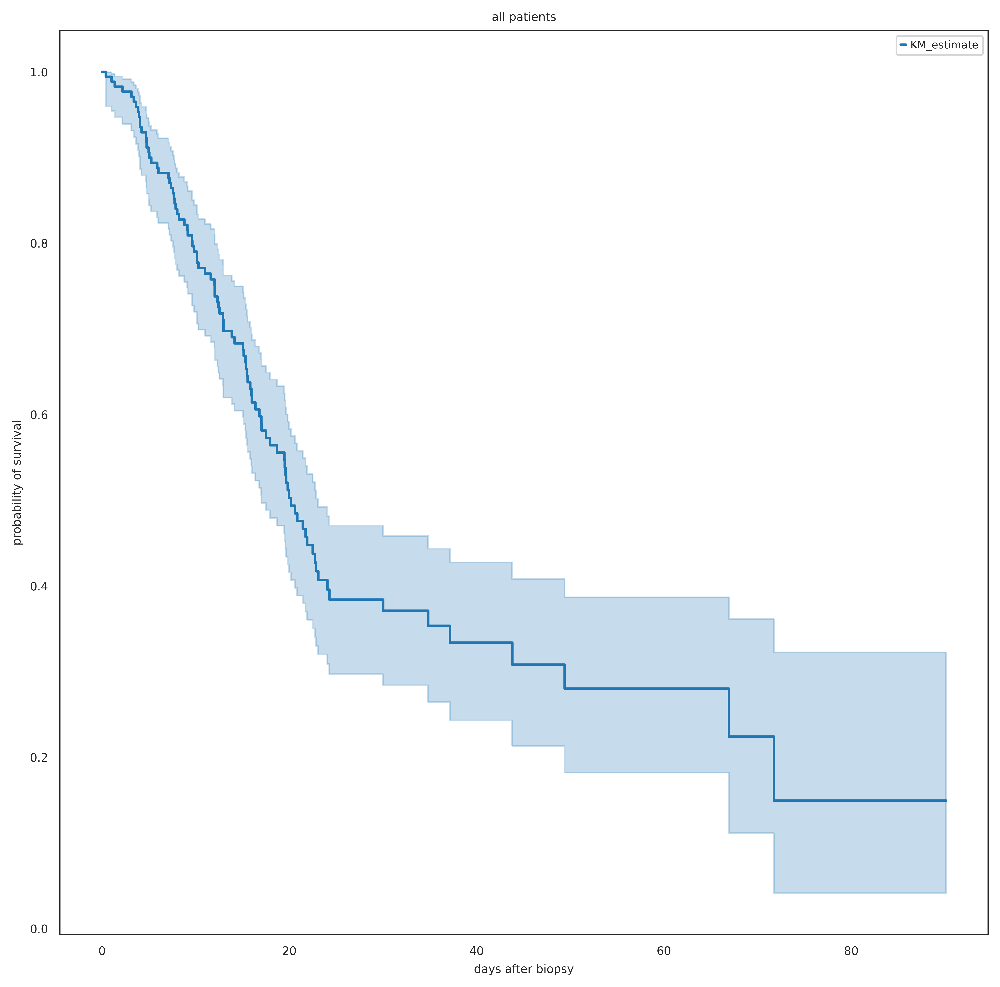

In [290]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after biopsy')
plt.ylabel('probability of survival')

In [291]:
#split data
GSEA_result_meta_high = GSEA_result_meta[GSEA_result_meta['CD56dim_sig_PAAD']>=GSEA_result_meta['CD56dim_sig_PAAD'].quantile(q=0.5)]
GSEA_result_meta_low = GSEA_result_meta[GSEA_result_meta['CD56dim_sig_PAAD']<GSEA_result_meta['CD56dim_sig_PAAD'].quantile(q=0.5)]

In [292]:
GSEA_result_meta_low

,CD56dim_sig_PAAD,AGE,SEX,AJCC_PATHOLOGIC_TUMOR_STAGE,DAYS_LAST_FOLLOWUP,RADIATION_THERAPY,OS_STATUS,OS_MONTHS
TCGA-2J-AABI,-3.550265,55,Female,STAGE IIA,969.0,Yes,0,31.857185
TCGA-2J-AAB9,-3.219046,70,Female,STAGE IIB,NaN,Yes,1,20.613473
TCGA-FB-A4P6,-3.162673,54,Male,STAGE IIB,767.0,Yes,0,25.216162
TCGA-2L-AAQE,-3.229367,56,Male,STAGE IIB,NaN,No,1,22.487425
TCGA-FB-AAPU,-3.483498,41,Female,STAGE IIA,NaN,No,1,12.525890
...,...,...,...,...,...,...,...,...
TCGA-IB-A5SQ,-3.443173,56,Female,STAGE IB,NaN,No,1,7.199921
TCGA-XN-A8T3,-3.366551,67,Male,STAGE IB,951.0,Yes,0,31.265411
TCGA-IB-A6UG,-3.261547,65,Male,STAGE IIB,NaN,No,1,1.347930
TCGA-2J-AABO,-3.445074,43,Male,STAGE IIB,440.0,Yes,0,14.465595


In [293]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = GSEA_result_meta_high['OS_MONTHS'], event_observed = GSEA_result_meta_high['OS_STATUS'],label='CD56dim_high')
kmf_low.fit(durations = GSEA_result_meta_low['OS_MONTHS'], event_observed = GSEA_result_meta_low['OS_STATUS'],label='CD56dim_low')

<lifelines.KaplanMeierFitter:"CD56dim_low", fitted with 88 total observations, 41 right-censored observations>

In [294]:
kmf_high.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.000000,1,0,1,89,89
0.131505,1,0,1,0,88
1.019167,1,1,0,0,87
1.084920,1,0,1,0,86
2.630108,1,0,1,0,85
...,...,...,...,...,...
49.380281,1,1,0,0,5
63.845876,1,0,1,0,4
66.936253,1,1,0,0,3


Text(0, 0.5, 'probability of survival')

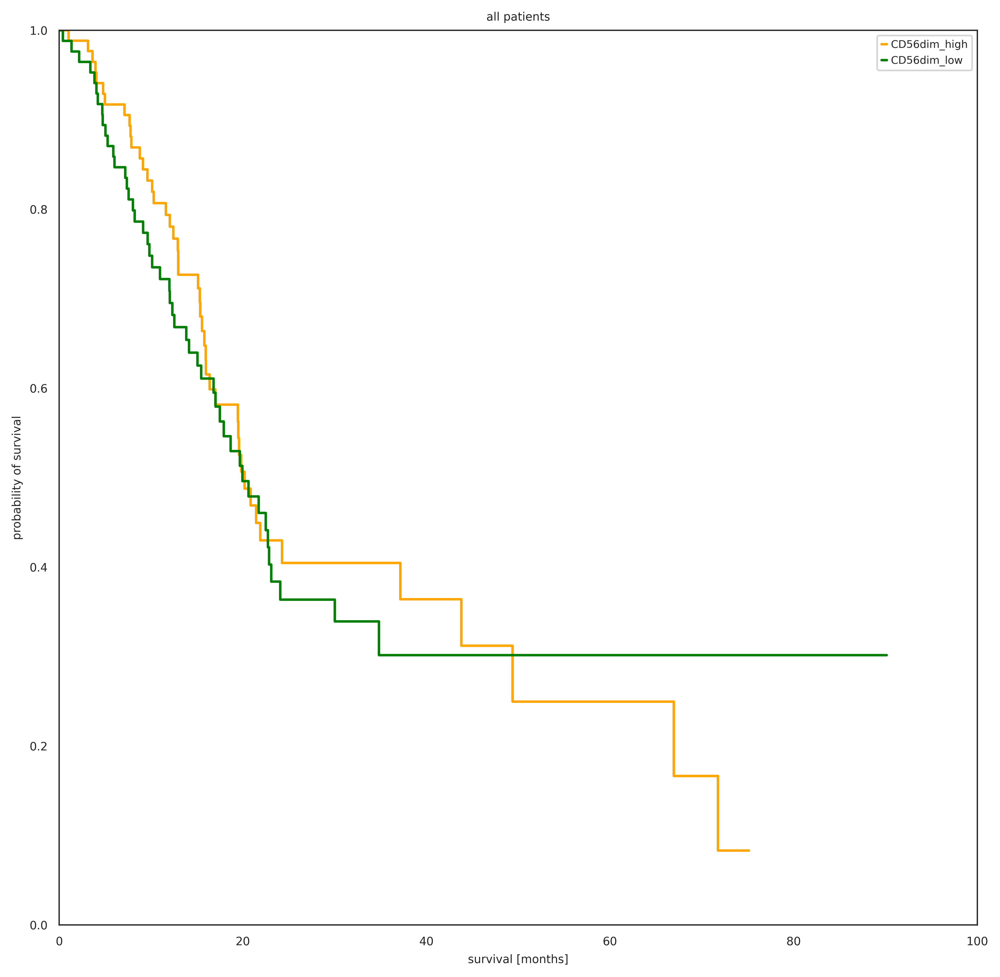

In [295]:
#plot all patients
X = np.linspace(-6, 6, 1024)
plt.ylim(0, 1)
plt.xlim(0,100)
kmf_high.plot(ci_show=False, color='orange')
kmf_low.plot(ci_show=False, color='green')
plt.title('all patients')
plt.xlabel('survival [months]')
plt.ylabel('probability of survival')

In [296]:
#variables for logrank
Time_A = GSEA_result_meta_high['OS_MONTHS']
Event_A = GSEA_result_meta_high['OS_STATUS']

Time_B = GSEA_result_meta_low['OS_MONTHS']
Event_B = GSEA_result_meta_low['OS_STATUS']

In [297]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.16 0.69      0.53

P value is: 0.6928736754612774


## cox proportional hazards

In [3853]:
from lifelines import CoxPHFitter
#select variables of importance
data = adata.obs.drop(columns=['Composite Element REF','days_to_death','days_to_last_followup','tumor_tissue_site','radiation_therapy','number_of_lymph_nodes'])
data = data.drop(columns=['pathology_T_stage','pathology_N_stage','histological_type','number_pack_years_smoked','year_of_tobacco_smoking_onset','race','ethnicity','CD56dim_sig_raw','date_of_initial_pathologic_diagnosis','pathology_M_stage','residual_tumor'])
data.head()

,years_to_birth,vital_status,pathologic_stage,gender,CD56dim_sig_norm_log1p,status
Hybridization REF,,,,,,
tcga-2j-aab1,65.0,1,stage iib,male,2.909826,66
tcga-2j-aab4,48.0,0,stage iib,male,1.695749,729
tcga-2j-aab6,75.0,1,stage iia,male,0.000000,293
tcga-2j-aab8,71.0,0,stage iib,male,2.413608,80
tcga-2j-aab9,70.0,1,stage iib,female,3.288127,627


In [3750]:
#drop variables containing nan
data=data.dropna()
data = data[data.loc[:,'pathologic_stage']!= 'nan']
data = data[data.loc[:,'pathologic_stage']!= 'stage iv']

In [3751]:
#CoxPH needs float values only --> conver using dictionaries

pathologic_stage_dict = {'stage i':1,'stage ia':1,'stage ib':1,'stage iia':2,'stage iib':2,'stage iii':3,'stage iv':4}
gender_dict = {'male':0,'female':1}
data['pathologic_stage'] = data['pathologic_stage'].map(pathologic_stage_dict)
data['gender'] = data['gender'].map(gender_dict)

In [3752]:
data

,years_to_birth,vital_status,pathologic_stage,gender,CD56dim_sig_norm_log1p,status
Hybridization REF,,,,,,
tcga-2j-aab1,65.0,1,2.0,0,0.727456,66
tcga-2j-aab4,48.0,0,2.0,0,0.885691,729
tcga-2j-aab6,75.0,1,2.0,0,0.000000,293
tcga-2j-aab8,71.0,0,2.0,0,0.603402,80
tcga-2j-aab9,70.0,1,2.0,1,0.822032,627
...,...,...,...,...,...,...
tcga-xn-a8t3,67.0,0,1.0,0,0.609648,951
tcga-xn-a8t5,53.0,0,1.0,1,1.752296,720
tcga-yh-a8sy,73.0,0,3.0,1,0.929789,388


In [3753]:
#adjust datatypes
data['years_to_birth'] = data['years_to_birth'].astype(float)
data['vital_status'] = data['vital_status'].astype(float)
data['pathologic_stage'] = data['pathologic_stage'].astype(float)
data['gender'] = data['gender'].astype(float)
data['CD56dim_sig_norm_log1p'] = data['CD56dim_sig_norm_log1p'].astype(float)
data['status'] = data['status'].astype(float)
data['status'] = data['status']/30

In [3717]:
#fit data
kmf=KaplanMeierFitter()
kmf.fit(durations = data['status'],event_observed= data['vital_status'])
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.000000,1,0,1,168,168
0.133333,1,0,1,0,167
0.233333,1,0,1,0,166
0.266667,1,0,1,0,165
0.300000,1,0,1,0,164
...,...,...,...,...,...
67.866667,1,1,0,0,5
69.466667,1,0,1,0,4
72.733333,1,1,0,0,3


In [3718]:
#get the summary using CoxPH Fitter:
cph = CoxPHFitter()
cph.fit(data, 'status', event_col='vital_status')
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 168 total observations, 79 right-censored observations>
             duration col = 'status'
                event col = 'vital_status'
      baseline estimation = breslow
   number of observations = 168
number of events observed = 89
   partial log-likelihood = -380.09
         time fit was run = 2020-12-07 14:40:33 UTC

---
                         coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                      
years_to_birth           0.03       1.03       0.01             0.01             0.05                 1.01                 1.05
pathologic_stage         0.55       1.74       0.31            -0.06             1.16                 0.94                 3.20
gender                   0.19       1.21       0.21            -0.23             0.61                 0.79                 1.84
CD56dim_sig_norm_log1p  -1.08       0.34       0.39            -1.84            -0.32                 0.16                 0.72

                           z    p   -log2(p)
covariate                                   
years_to_birth          2.45 0.01       6.13
pathologic_stage        1.78 0.08       3.73
gender                  0.87 0.38       1.39
CD56dim_sig_norm_log1p -2.79 0.01       7.57
---
Concordance = 0.61
Partial AIC = 768.18
log-likelihood ratio test = 17.29 on 4 df
-log2(p) of ll-ratio test = 9.20

# only stage vs CD56dim

In [3622]:
from lifelines import CoxPHFitter
#select variables of importance
data = adata.obs.drop(columns=['Composite Element REF','days_to_death','days_to_last_followup','tumor_tissue_site','radiation_therapy','number_of_lymph_nodes'])
data = data.drop(columns=['gender','years_to_birth','pathology_T_stage','pathology_N_stage','histological_type','number_pack_years_smoked','year_of_tobacco_smoking_onset','race','ethnicity','CD56dim_sig_raw','date_of_initial_pathologic_diagnosis','pathology_M_stage','residual_tumor'])
data.head()

,vital_status,pathologic_stage,CD56dim_sig_norm_log1p,status
Hybridization REF,,,,
tcga-2j-aab1,1,stage iib,2.909826,66
tcga-2j-aab4,0,stage iib,1.695749,729
tcga-2j-aab6,1,stage iia,0.000000,293
tcga-2j-aab8,0,stage iib,2.413608,80
tcga-2j-aab9,1,stage iib,3.288127,627


In [3623]:
#drop variables containing nan
data=data.dropna()
data = data[data.loc[:,'pathologic_stage']!= 'nan']
data = data[data.loc[:,'pathologic_stage']!= 'stage iv']

In [3475]:
#CoxPH needs float values only --> conver using dictionaries

pathologic_stage_dict = {'stage i':1,'stage ia':1,'stage ib':1,'stage iia':2,'stage iib':2,'stage iii':3,'stage iv':4}

data['pathologic_stage'] = data['pathologic_stage'].map(pathologic_stage_dict)

In [3476]:
data

,vital_status,pathologic_stage,CD56dim_sig_norm_log1p,status
Hybridization REF,,,,
tcga-2j-aab1,1,2.0,2.589680,66
tcga-2j-aab4,0,2.0,2.562428,729
tcga-2j-aab6,1,2.0,1.898485,293
tcga-2j-aab8,0,2.0,2.543680,80
tcga-2j-aab9,1,2.0,2.631525,627
...,...,...,...,...
tcga-xn-a8t3,0,1.0,2.761286,951
tcga-xn-a8t5,0,1.0,3.524051,720
tcga-yh-a8sy,0,3.0,2.217930,388


In [3477]:
#adjust datatypes
data['vital_status'] = data['vital_status'].astype(float)
data['pathologic_stage'] = data['pathologic_stage'].astype(float)
data['CD56dim_sig_norm_log1p'] = data['CD56dim_sig_norm_log1p'].astype(float)
data['status'] = data['status'].astype(float)
data['status'] = data['status']/30

In [3478]:
#fit data
kmf=KaplanMeierFitter()
kmf.fit(durations = data['status'],event_observed= data['vital_status'])
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.000000,1,0,1,168,168
0.133333,1,0,1,0,167
0.233333,1,0,1,0,166
0.266667,1,0,1,0,165
0.300000,1,0,1,0,164
...,...,...,...,...,...
67.866667,1,1,0,0,5
69.466667,1,0,1,0,4
72.733333,1,1,0,0,3


In [3479]:
#get the summary using CoxPH Fitter:
cph = CoxPHFitter()
cph.fit(data, 'status', event_col='vital_status')
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 168 total observations, 79 right-censored observations>
             duration col = 'status'
                event col = 'vital_status'
      baseline estimation = breslow
   number of observations = 168
number of events observed = 89
   partial log-likelihood = -385.91
         time fit was run = 2020-12-06 23:33:13 UTC

---
                         coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                      
pathologic_stage         0.56       1.74       0.29            -0.02             1.13                 0.98                 3.11
CD56dim_sig_norm_log1p  -0.38       0.68       0.23            -0.84             0.07                 0.43                 1.08

                           z    p   -log2(p)
covariate                                   
pathologic_stage        1.88 0.06       4.07
CD56dim_sig_norm_log1p -1.64 0.10       3.32
---
Concordance = 0.57
Partial AIC = 775.82
log-likelihood ratio test = 5.66 on 2 df
-log2(p) of ll-ratio test = 4.08

# correlate NK cells with CXCL8 expression 

In [ ]:
adata.obs['CXCL8']= 

In [1183]:
adata[adata.var['CXCL8']]

KeyError: 'CXCL8'

In [3480]:
all_genes_df = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs_names)
CXCL8_NK_df = pd.concat([adata.obs['CD56dim_sig_norm_log1p'],all_genes_df['IL8']], axis=1)
CXCL8_NK_df

,CD56dim_sig_norm_log1p,IL8
Hybridization REF,,
tcga-2j-aab1,2.589680,7.032684
tcga-2j-aab4,2.562428,8.526242
tcga-2j-aab6,1.898485,7.882202
tcga-2j-aab8,2.543680,7.877063
tcga-2j-aab9,2.631525,7.525156
...,...,...
tcga-xn-a8t3,2.761286,6.491359
tcga-xn-a8t5,3.524051,7.997890
tcga-yh-a8sy,2.217930,7.725502


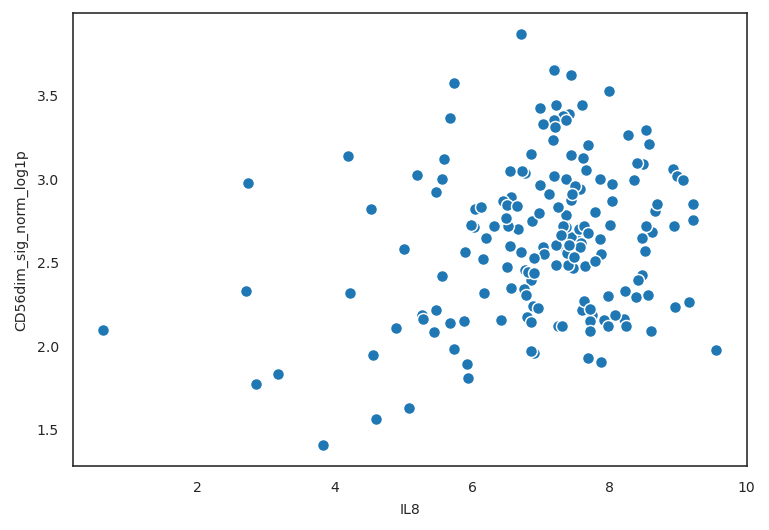

In [3481]:
sns.scatterplot(data=CXCL8_NK_df, x='IL8',y='CD56dim_sig_norm_log1p')

In [ ]:
scipy.stats.spearmanr(CXCL8_NK_df['CD56dim_sig_norm_log1p'],CXCL8_NK_df['IL8'])

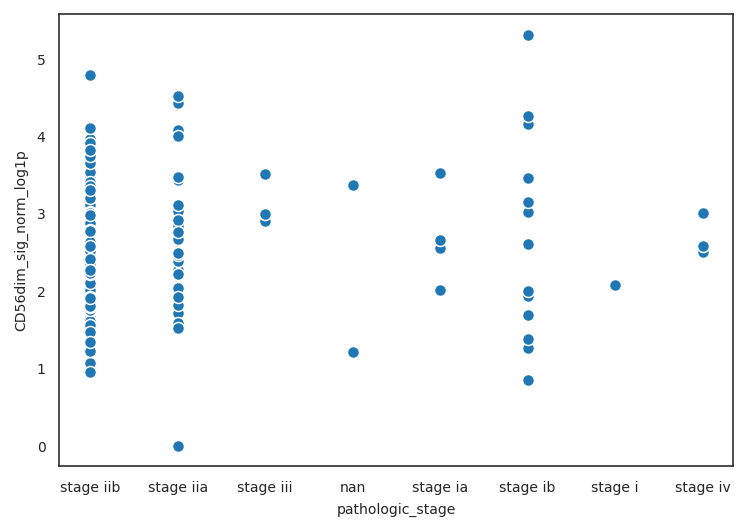

In [3883]:
sns.scatterplot(data=adata.obs, x='pathologic_stage',y='CD56dim_sig_norm_log1p')

# GSEA

In [9]:
import gseapy as gp
gp.__version__

'0.9.17'

In [6]:
cluster_df = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/PAAD_Peng_Sun-X-10.1038s41422-019-0195-y-X-all_samples_raw_filtered_normalized_log1p_clustered_nodrop_nodub_removed_clustered_cnv_annotated_imputed_mean_genes_per_cluster_for_GSEA.csv', index_col=0)

In [7]:
cluster_df

,0,1,2,3,4,5,6,7,8,9,...,71,72,73,74,75,76,77,78,79,80
RAC2,0.015104,0.359133,0.125118,0.032628,0.016447,0.001192,0.001756,0.014280,0.001878,0.337335,...,0.013439,0.025358,0.008653,0.003259,0.031553,0.000000,0.000000,0.000000,0.022623,0.017702
RP11-406A9.2,0.000021,0.000000,0.000000,0.000000,0.000040,0.000000,0.000314,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SPR,0.010701,0.005072,0.011178,0.055525,0.021296,0.018162,0.049832,0.012275,0.020157,0.003494,...,0.020086,0.037715,0.042153,0.016931,0.042180,0.039872,0.061148,0.015679,0.014234,0.090826
C1QTNF1,0.194093,0.005642,0.005271,0.014000,0.020840,0.002658,0.007714,0.039742,0.003951,0.005389,...,0.015624,0.016154,0.019026,0.000000,0.023714,0.012803,0.006858,0.156058,0.000000,0.000000
CCDC144NL,0.000470,0.000483,0.000543,0.000000,0.000450,0.000573,0.000584,0.000687,0.000501,0.000227,...,0.001379,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PSMD9,0.002880,0.002935,0.001559,0.001724,0.003303,0.002740,0.003523,0.002378,0.001421,0.002684,...,0.007521,0.004539,0.000000,0.002281,0.001378,0.003580,0.003174,0.000000,0.000000,0.000000
RAD51AP1,0.003014,0.003011,0.014557,0.002048,0.002704,0.001286,0.001638,0.002863,0.000714,0.002624,...,0.000884,0.003919,0.000000,0.000000,0.002324,0.000000,0.000000,0.000000,0.000000,0.047048
MAGED4,0.000083,0.000000,0.000000,0.000195,0.000095,0.000000,0.000000,0.000190,0.000000,0.000000,...,0.000252,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RP11-805I24.1,0.000754,0.000000,0.000174,0.000000,0.000128,0.000181,0.000202,0.000062,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [107]:
cluster_df.columns

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60',
       '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72',
       '73', '74', '75', '76', '77', '78', '79', '80'],
      dtype='object')

In [10]:
gene_list = ['GZMA','GZMB','GZMH','GZMK','GZMM','NKG7','PRF1','FGFBP2','LAMP1','LAMP2','GNLY', 'STXBP2']

In [55]:
class_vector = ['other']*8+['CD56dim']+['other']+['CD56dim']+['other']*70
class_vector

['other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'CD56dim',
 'other',
 'CD56dim',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other',
 'other']

In [20]:
gs_res = gp.gsea(data=cluster_df,
                gene_sets='KEGG_2016',
                cls = class_vector,
                permutation_type = 'phenotype',
                permutation_num=10,
                outdir=None,
                no_plot=False,
                method='signal_to_noise',
                processes=4, seed=7,
                format='png')

In [21]:
gs_res.res2d.sort_index().shape

(275, 8)

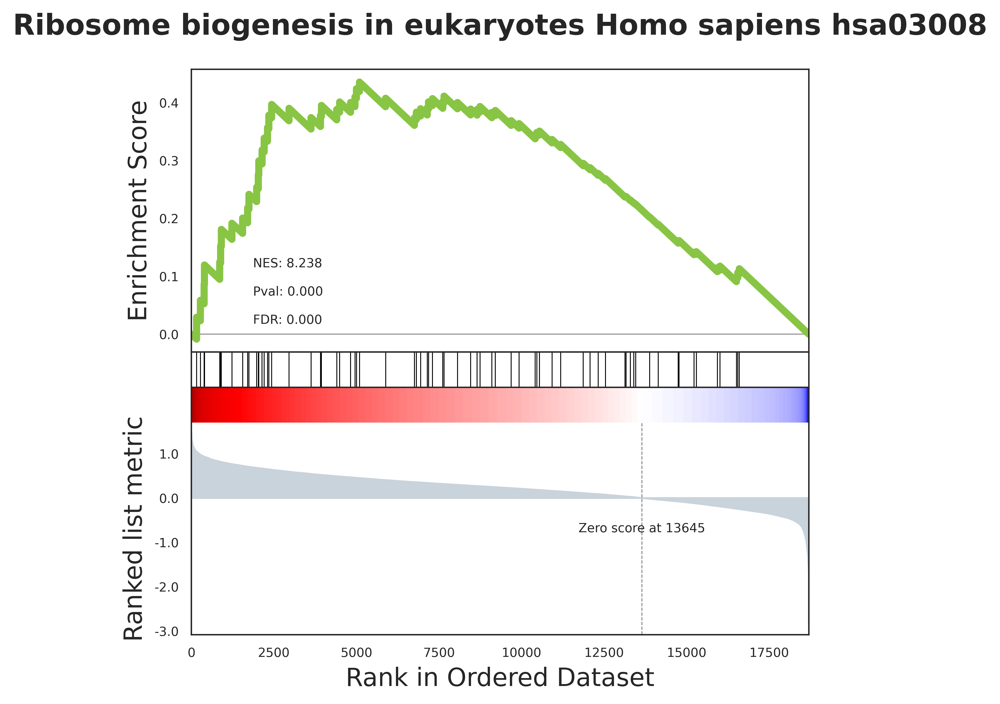

In [27]:
from gseapy.plot import gseaplot, heatmap
terms = gs_res.res2d.index
gseaplot(gs_res.ranking, term=terms[3],**gs_res.results[terms[3]])

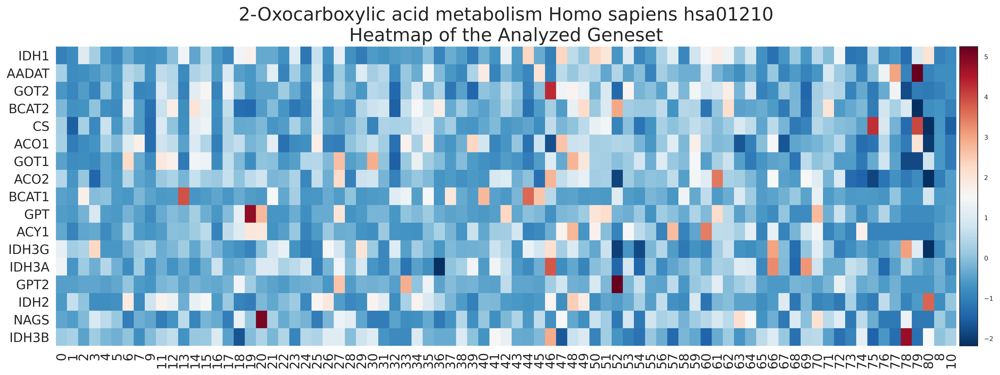

In [28]:
# plotting heatmap
genes = gs_res.res2d.genes[0].split(";")
# Make sure that ``ofname`` is not None, if you want to save your figure to disk
heatmap(df = gs_res.heatmat.loc[genes], z_score=0, title=terms[0], figsize=(18,6))

In [53]:
gene_list = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/gsea_gene_sets_2.csv')
gene_list

,"""""""""""""\ncellular_cytotoxicity_effectors_setset of molecules directly involved in cytotoxic granule release from T/NK cells""GZMA""GZMB""GZMH""GZMK""GZMM""NKG7""PRF1""FGFBP2""LAMP1""LAMP2""GLNY""STXBP2"


In [137]:
read.gmt('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/gsea_gene_sets.csv')

NameError: name 'read' is not defined

In [121]:
gs_res = gp.gsea(data=cluster_df,
                gene_sets=gene_list,
                cls = class_vector,
                permutation_type = 'phenotype',
                permutation_num=10,
                outdir=None,
                no_plot=False,
                method='signal_to_noise',
                processes=4, seed=7,
                format='png')

Exception: Error parsing gene_sets parameter for gene sets

In [138]:
phenoA, phenoB, class_vector =  gp.parser.gsea_cls_parser("./cytotox.cls")

In [139]:
#class_vector used to indicate group attributes for each sample
print(class_vector)



['other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'CD56dim', 'other', 'CD56dim', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other', 'other']


In [140]:
gene_exp.colums = gene_exp.columns.astype(str)

In [141]:
gene_exp = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/PAAD_Peng_Sun-X-10.1038s41422-019-0195-y-X-all_samples_raw_filtered_normalized_log1p_clustered_nodrop_nodub_removed_clustered_cnv_annotated_imputed_mean_genes_per_cluster_for_GSEA.csv', index_col=0)
gene_exp.colums = map(str, gene_exp.columns)
gene_exp.head()


<ipython-input-141-62d426e7748a>:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  gene_exp.colums = map(str, gene_exp.columns)


,0,1,2,3,4,5,6,7,8,9,...,71,72,73,74,75,76,77,78,79,80
RAC2,0.015104,0.359133,0.125118,0.032628,0.016447,0.001192,0.001756,0.014280,0.001878,0.337335,...,0.013439,0.025358,0.008653,0.003259,0.031553,0.000000,0.000000,0.000000,0.022623,0.017702
RP11-406A9.2,0.000021,0.000000,0.000000,0.000000,0.000040,0.000000,0.000314,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SPR,0.010701,0.005072,0.011178,0.055525,0.021296,0.018162,0.049832,0.012275,0.020157,0.003494,...,0.020086,0.037715,0.042153,0.016931,0.042180,0.039872,0.061148,0.015679,0.014234,0.090826
C1QTNF1,0.194093,0.005642,0.005271,0.014000,0.020840,0.002658,0.007714,0.039742,0.003951,0.005389,...,0.015624,0.016154,0.019026,0.000000,0.023714,0.012803,0.006858,0.156058,0.000000,0.000000
CCDC144NL,0.000470,0.000483,0.000543,0.000000,0.000450,0.000573,0.000584,0.000687,0.000501,0.000227,...,0.001379,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [127]:
print("positively correlated: ", phenoA)

positively correlated:  0


In [128]:
print("negtively correlated: ", phenoB)

negtively correlated:  1


In [142]:
# run gsea
# enrichr libraries are supported by gsea module. Just provide the name

gs_res = gp.gsea(data=gene_exp, # or data='./P53_resampling_data.txt'
                 gene_sets='/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/gsea_gene_sets.gmt', # enrichr library names
                 cls= "./cytotox.cls", # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7, min_size=5,
                 format='png')

2020-12-13 17:48:17,458 No gene sets passed through filtering condition!!!, try new parameters again!
Note: check gene name, gmt file format, or filtering size.


SystemExit: 0

/home/thomas/miniconda3/envs/2020_Peer_PanTumorImmuneTyping/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3339: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [106]:
#access the dataframe results throught res2d attribute
gs_res.res2d.sort_index().head()

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
cellular_cytotoxicity_effectors_set,0.66109,7.322845,0.0,0.0,12,11,FGFBP2;PRF1;NKG7;GZMB;GZMM;GZMH;GZMA;GZMK;STXB...,FGFBP2;PRF1;NKG7;GZMB;GZMM;GZMH;GZMA


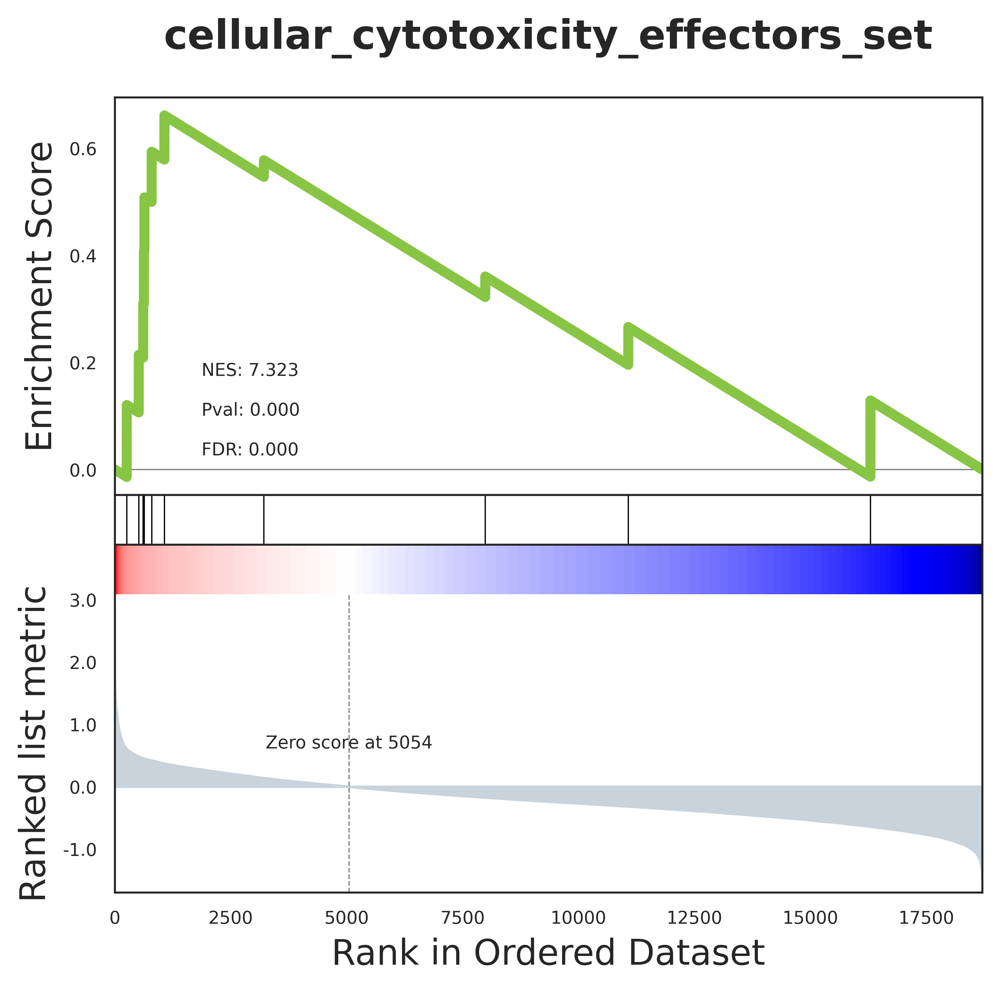

In [83]:
from gseapy.plot import gseaplot, heatmap
terms = gs_res.res2d.index
# Make sure that ``ofname`` is not None, if you want to save your figure to disk
gseaplot(gs_res.ranking, term=terms[0], **gs_res.results[terms[0]])

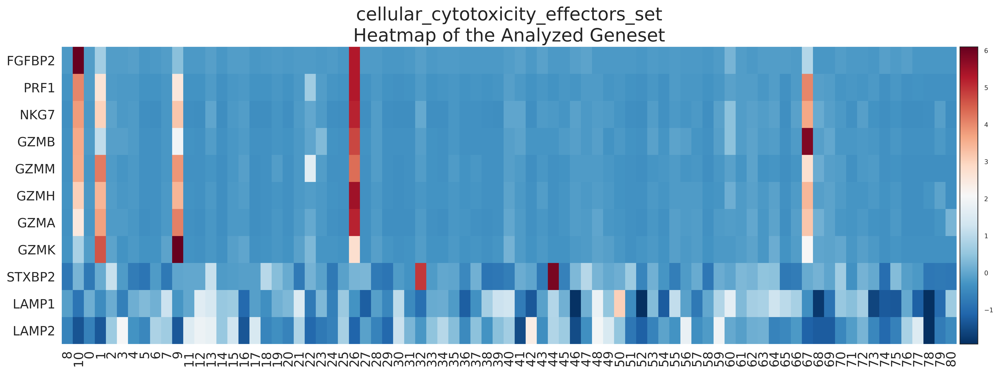

In [86]:
# plotting heatmap
genes = gs_res.res2d.genes[0].split(";")
# Make sure that ``ofname`` is not None, if you want to save your figure to disk
heatmap(df = gs_res.heatmat.loc[genes], z_score=0, title=terms[0], figsize=(18,6))

In [87]:
#access the dataframe results throught res2d attribute
gs_res.res2d.sort_index().head()

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
cellular_cytotoxicity_effectors_set,0.66109,7.322845,0.0,0.0,12,11,FGFBP2;PRF1;NKG7;GZMB;GZMM;GZMH;GZMA;GZMK;STXB...,FGFBP2;PRF1;NKG7;GZMB;GZMM;GZMH;GZMA


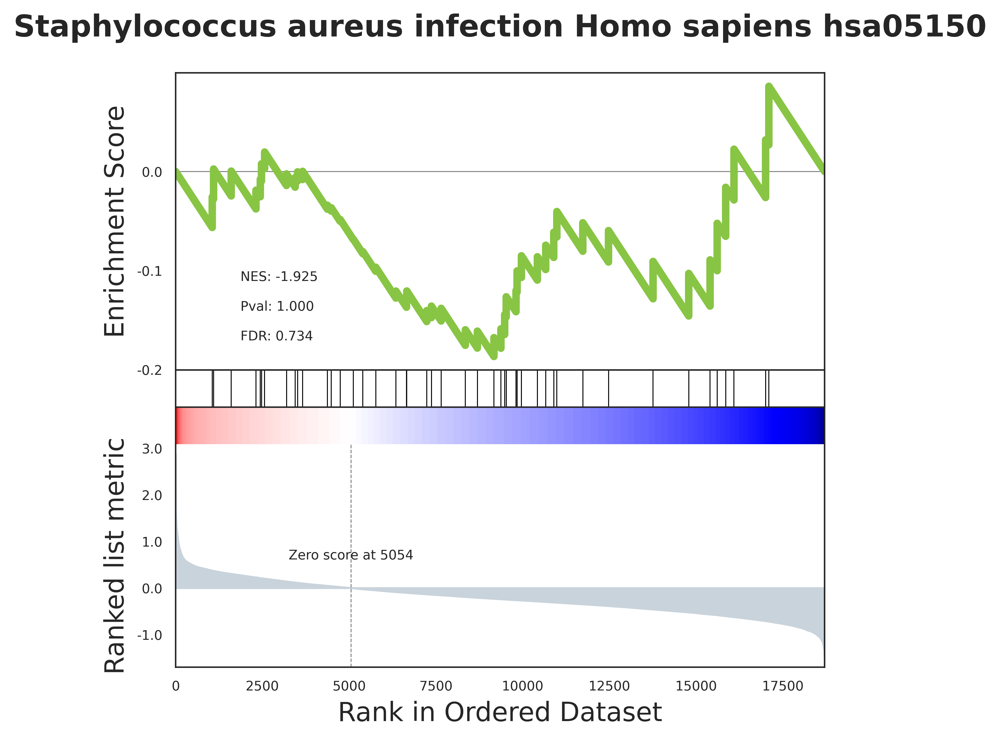

In [70]:


from gseapy.plot import gseaplot, heatmap
terms = gs_res.res2d.index
# Make sure that ``ofname`` is not None, if you want to save your figure to disk
gseaplot(gs_res.ranking, term=terms[100], **gs_res.results[terms[100]])



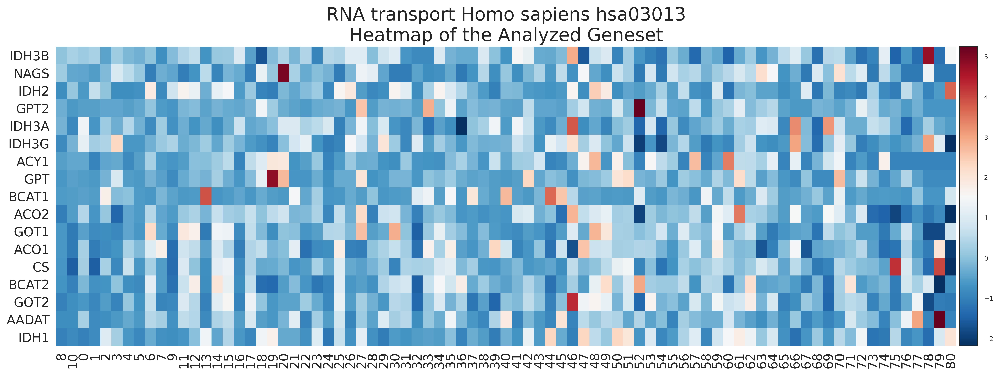

In [72]:

# plotting heatmap
genes = gs_res.res2d.genes[0].split(";")
# Make sure that ``ofname`` is not None, if you want to save your figure to disk
heatmap(df = gs_res.heatmat.loc[genes], z_score=0, title=terms[2], figsize=(18,6))

# enrichr

In [94]:
#load DEGs and sort by log2fc
wald = pd.read_csv('PAAD_Peng_Sun-X-10.1038s41422-019-0195-y-X-all_samples_raw_filtered_normalized_log1p_clustered_nodrop_nodub_removed_clustered_cnv_annotated_CD56dim_wald_csv_all_reanalysis.csv', index_col='gene')
wald = wald.sort_values('log2fc',axis=0, ascending=False,inplace=False, na_position='last')

In [97]:
#convert df to list
# convert dataframe or series to list
glist = list(wald.index)
glist

['FGFBP2',
 'LIM2',
 'PTH2',
 'KIR3DL1',
 'TRGJP1',
 'MORC1',
 'KLRF1',
 'KIR3DX1',
 'PRSS57',
 'NCR1',
 'TNNI1',
 'AC097713.4',
 'KIR2DL1',
 'GNLY',
 'SH2D1B',
 'KIR3DL2',
 'KIR2DL3',
 'DPPA4',
 'CXCR1',
 'AC017104.2',
 'TISP43',
 'S1PR5',
 'TRDC',
 'CXCR2',
 'PRF1',
 'TRGV9',
 'KLRD1',
 'NKG7',
 'KLRK1',
 'CD160',
 'ZMAT4',
 'GOLGA8G',
 'FCRL6',
 'TRDJ2',
 'RP11-81H14.1',
 'SPINK2',
 'GZMB',
 'NNAT',
 'CDHR1',
 'LINC00237',
 'RP11-81H14.2',
 'PRL',
 'TRGV1',
 'TBX21',
 'RP11-104L21.3',
 'GZMH',
 'LINC01505',
 'EPGN',
 'NME8',
 'MLC1',
 'RPRM',
 'KLRF2',
 'CTSW',
 'SLC1A7',
 'TRGC1',
 'XCL2',
 'PTGDR',
 'TXK',
 'XCL1',
 'KLRC2',
 'TRGV2',
 'B3GAT1',
 'LEXM',
 'MYOM2',
 'KLRC3',
 'CX3CR1',
 'TRAV1-2',
 'CYP26C1',
 'RP11-121A8.1',
 'RP11-700H6.4',
 'KIR2DL4',
 'CST7',
 'LINC00299',
 'SOST',
 'ADGRG3',
 'SERPINA11',
 'ST8SIA6',
 'TRAJ41',
 'MAS1',
 'RP11-973H7.4',
 'CD244',
 'TRGV10',
 'FXYD7',
 'CD247',
 'TRBV16',
 'ITGAD',
 'SAMD3',
 'EOMES',
 'RP11-222K16.2',
 'LINC00996',
 'TMIGD2',


In [98]:
names = gp.get_library_name() # default: Human
names[:10]


['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_down']

In [134]:
type(glist[0:1000])

list

In [135]:
enr = gp.enrichr(gene_list=glist[0,
                 gene_sets=['KEGG_2016'],
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 description='test_name',
                 outdir='test/enrichr_kegg',
                 # no_plot=True,
                 cutoff=0.5 # test dataset, use lower value from range(0,1)
                )

In [ ]:
# obj.results stores all results
enr.results.head(5)

In [ ]:
# simple plotting function
from gseapy.plot import barplot, dotplot

# to save your figure, make sure that ``ofname`` is not None
barplot(enr.res2d,title='KEGG_2013',)



# CIBERSORT stats

In [5]:
#paths and parameters
CIBERSORT_path = '/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/CIBERSORT.Output_intensity_based_allsamples.csv'

In [30]:
#read
CIBERSORT_df = pd.read_csv(CIBERSORT_path)
CIBERSORT_df['patient']= CIBERSORT_df['Input Sample'].str.slice(stop=3)
CIBERSORT_df

,Input Sample,Timepoint (array),Real timepoint (d0 is start of RCTX),B_cells_naive,B_cells_memory,Plasma_cells,T_cells_CD8,T_cells_CD4_naive,T_cells_CD4_memory_resting,T_cells_CD4_memory_activated,...,Dendritic_cells_resting,Dendritic_cells_activated,Mast_cells_resting,Mast_cells_activated,Eosinophils,Neutrophils,P-value,Pearson Correlation,RMSE,patient
0,A15,0,-7,0.052974,0.0,0.002220,0.050103,0.026809,0.000000,0.039094,...,0,0.000000,0.023463,0.0000,0.0,0.380457,0.000,0.706378,0.707658,A15
1,A15_1,8,0,0.010719,0.0,0.000000,0.083574,0.020138,0.000000,0.025754,...,0,0.000100,0.000000,0.0000,0.0,0.357715,0.000,0.747526,0.664202,A15
2,A15_2,24,14,0.000000,0.0,0.006513,0.036946,0.045005,0.000000,0.016595,...,0,0.000000,0.030598,0.0000,0.0,0.474911,0.000,0.729414,0.686299,A15
3,A15_3,70,62,0.022941,0.0,0.008342,0.086408,0.006587,0.000000,0.053288,...,0,0.000000,0.004943,0.0003,0.0,0.312012,0.000,0.710493,0.703486,A15
4,A16,0,-7,0.008748,0.0,0.002803,0.069710,0.000000,0.042489,0.015849,...,0,0.000000,0.000000,0.0005,0.0,0.241642,0.000,0.739184,0.676687,A16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,B30_69,24,14,0.000000,0.0,0.013573,0.016867,0.048554,0.000000,0.014574,...,0,0.000200,0.029682,0.0000,0.0,0.456347,0.000,0.686460,0.733350,B30
94,B30_70,70,62,0.008275,0.0,0.011937,0.443618,0.000000,0.000000,0.058541,...,0,0.000000,0.028352,0.0000,0.0,0.131799,0.001,0.569073,0.822334,B30
95,B32,0,-7,0.007109,0.0,0.001378,0.078607,0.004753,0.009102,0.033724,...,0,0.003559,0.024243,0.0000,0.0,0.291949,0.000,0.740864,0.673314,B32
96,B32_71,8,0,0.018707,0.0,0.005632,0.057862,0.030637,0.000000,0.018408,...,0,0.000700,0.004505,0.0000,0.0,0.344497,0.000,0.738233,0.674301,B32


In [20]:
CIBERSORT_df_subset

,Input Sample,Timepoint (array),Real timepoint (d0 is start of RCTX),B_cells_naive,B_cells_memory,Plasma_cells,T_cells_CD8,T_cells_CD4_naive,T_cells_CD4_memory_resting,T_cells_CD4_memory_activated,...,Macrophages_M2,Dendritic_cells_resting,Dendritic_cells_activated,Mast_cells_resting,Mast_cells_activated,Eosinophils,Neutrophils,P-value,Pearson Correlation,RMSE
1,A15_1,8,0,0.010719,0.000000,0.000000,0.083574,0.020138,0.000000,0.025754,...,0.000000,0,0.000100,0.000000,0.000000,0.000000,0.357715,0.000,0.747526,0.664202
2,A15_2,24,14,0.000000,0.000000,0.006513,0.036946,0.045005,0.000000,0.016595,...,0.000000,0,0.000000,0.030598,0.000000,0.000000,0.474911,0.000,0.729414,0.686299
5,A16_4,8,0,0.000900,0.000000,0.001825,0.065345,0.026097,0.018097,0.021743,...,0.000000,0,0.000000,0.003784,0.000000,0.000000,0.271619,0.000,0.758910,0.653874
6,A16_5,24,14,0.016428,0.000000,0.011261,0.015610,0.040403,0.000000,0.036079,...,0.000000,0,0.008339,0.003939,0.000000,0.000000,0.442823,0.000,0.701830,0.714314
8,A17_6,8,0,0.008627,0.000000,0.001922,0.122618,0.029022,0.000000,0.023676,...,0.000000,0,0.000000,0.000000,0.003041,0.000000,0.376669,0.000,0.750242,0.661879
9,A17_7,24,14,0.000000,0.000000,0.006959,0.054628,0.036296,0.007706,0.025459,...,0.000000,0,0.010563,0.032954,0.000000,0.000000,0.455743,0.000,0.725609,0.688952
12,A18_8,8,0,0.013586,0.000000,0.012358,0.038336,0.062062,0.000000,0.019901,...,0.000000,0,0.000000,0.017759,0.000000,0.000000,0.275984,0.000,0.763917,0.650887
13,A18_9,24,14,0.000000,0.000000,0.007217,0.004263,0.014141,0.000000,0.000000,...,0.000000,0,0.001406,0.000000,0.037975,0.000000,0.574461,0.000,0.672480,0.764205
15,A19_11,24,14,0.000000,0.000000,0.006189,0.034034,0.063857,0.000000,0.007859,...,0.000000,0,0.007688,0.017712,0.000000,0.000000,0.343520,0.000,0.759734,0.650843
19,A20_14,8,0,0.000000,0.003939,0.010405,0.018270,0.072409,0.000000,0.020320,...,0.000000,0,0.012677,0.025010,0.000000,0.000000,0.414961,0.000,0.724003,0.690062


In [26]:
scipy.stats.wilcoxon(a, y=b, zero_method='wilcox', correction=False, alternative='two-sided')

ValueError: The samples x and y must have the same length.

In [118]:
CIBERSORT_df_subset.columns

Index(['Input Sample', 'Timepoint (array)',
       'Real timepoint (d0 is start of RCTX)', 'B_cells_naive',
       'B_cells_memory', 'Plasma_cells', 'T_cells_CD8', 'T_cells_CD4_naive',
       'T_cells_CD4_memory_resting', 'T_cells_CD4_memory_activated',
       'T_cells_follicular_helper', 'T_cells_regulatory',
       'T_cells_gamma_delta', 'NK_cells_resting', 'NK_cells_activated',
       'Monocytes', 'Macrophages_M0', 'Macrophages_M1', 'Macrophages_M2',
       'Dendritic_cells_resting', 'Dendritic_cells_activated',
       'Mast_cells_resting', 'Mast_cells_activated', 'Eosinophils',
       'Neutrophils', 'P-value', 'Pearson Correlation', 'RMSE', 'patient'],
      dtype='object')

In [32]:
CIBERSORT_df_subset[CIBERSORT_df_subset['Real timepoint (d0 is start of RCTX)']==i[0]][j]

2     0.474911
6     0.442823
9     0.455743
13    0.574461
15    0.343520
20    0.566007
23    0.091505
27    0.216033
31    0.239592
35    0.070166
39    0.142729
43    0.406874
46    0.182623
50    0.562709
54    0.193048
58    0.433481
62    0.178039
66    0.259891
73    0.321737
77    0.234348
81    0.257255
85    0.297945
89    0.165132
93    0.456347
97    0.092350
Name: Neutrophils, dtype: float64

In [119]:
#wilcoxon matched pairs signed rank test for d0 vs d14, d0 vs d62, d14 vs d62

comparison_list = [[0,14],[0,62],[14,62]]
cell_type_list = ['B_cells_naive',
       'B_cells_memory', 'Plasma_cells', 'T_cells_CD8', 'T_cells_CD4_naive',
       'T_cells_CD4_memory_resting', 'T_cells_CD4_memory_activated',
       'T_cells_follicular_helper', 'T_cells_regulatory',
       'T_cells_gamma_delta', 'NK_cells_resting', 'NK_cells_activated',
       'Monocytes', 'Macrophages_M0', 'Macrophages_M1', 'Macrophages_M2',
       'Dendritic_cells_resting', 'Dendritic_cells_activated',
       'Mast_cells_resting', 'Mast_cells_activated', 'Eosinophils',
       'Neutrophils',]

#list containing the comparison vectors for each timepoint comparison and cell type in the order indicated above
#identity list is to double check the comparison
matched_array_list = []
matched_array_identity_list = []

for i in comparison_list:
    CIBERSORT_df_subset = CIBERSORT_df[CIBERSORT_df['Real timepoint (d0 is start of RCTX)'].isin(i)]
    for j in cell_type_list:
        a = []
        b = []
        for k in set(CIBERSORT_df_subset['patient']):
            CIBERSORT_df_subset_patient = CIBERSORT_df_subset[CIBERSORT_df_subset['patient']==k]
            
            if i[0] in list(CIBERSORT_df_subset_patient['Real timepoint (d0 is start of RCTX)']) and i[1] in list(CIBERSORT_df_subset_patient['Real timepoint (d0 is start of RCTX)']):
                a.append(list(CIBERSORT_df_subset_patient[CIBERSORT_df_subset_patient['Real timepoint (d0 is start of RCTX)']==i[0]][j])[0])
                b.append(list(CIBERSORT_df_subset_patient[CIBERSORT_df_subset_patient['Real timepoint (d0 is start of RCTX)']==i[1]][j])[0])
        matched_array_list.append([a,b])
        matched_array_identity_list.append([i,j])

In [120]:
#check
print('identity lsit and array list for comparison have the same length:',
      len(matched_array_list) == len(matched_array_identity_list))

identity lsit and array list for comparison have the same length: True


In [121]:
#show comparisons (format [[[timepointA, timepointB],cell_type],...])
matched_array_identity_list

[[[0, 14], 'B_cells_naive'],
 [[0, 14], 'B_cells_memory'],
 [[0, 14], 'Plasma_cells'],
 [[0, 14], 'T_cells_CD8'],
 [[0, 14], 'T_cells_CD4_naive'],
 [[0, 14], 'T_cells_CD4_memory_resting'],
 [[0, 14], 'T_cells_CD4_memory_activated'],
 [[0, 14], 'T_cells_follicular_helper'],
 [[0, 14], 'T_cells_regulatory'],
 [[0, 14], 'T_cells_gamma_delta'],
 [[0, 14], 'NK_cells_resting'],
 [[0, 14], 'NK_cells_activated'],
 [[0, 14], 'Monocytes'],
 [[0, 14], 'Macrophages_M0'],
 [[0, 14], 'Macrophages_M1'],
 [[0, 14], 'Macrophages_M2'],
 [[0, 14], 'Dendritic_cells_resting'],
 [[0, 14], 'Dendritic_cells_activated'],
 [[0, 14], 'Mast_cells_resting'],
 [[0, 14], 'Mast_cells_activated'],
 [[0, 14], 'Eosinophils'],
 [[0, 14], 'Neutrophils'],
 [[0, 62], 'B_cells_naive'],
 [[0, 62], 'B_cells_memory'],
 [[0, 62], 'Plasma_cells'],
 [[0, 62], 'T_cells_CD8'],
 [[0, 62], 'T_cells_CD4_naive'],
 [[0, 62], 'T_cells_CD4_memory_resting'],
 [[0, 62], 'T_cells_CD4_memory_activated'],
 [[0, 62], 'T_cells_follicular_helper']

In [122]:
#wilcoxon signed rank test calculate p values:
pval_list = []
pval_identity_list = []

for h,i in enumerate(matched_array_list):
    #wilcox signed rank doesnt work if all values are 0 --> all ranks are equal
    if sum(i[0])+sum(i[1]) != 0:
        pval = scipy.stats.wilcoxon(i[0], y=i[1], zero_method='wilcox', correction=False, alternative='two-sided')[1]
        pval_list.append(pval)
        pval_identity_list.append(matched_array_identity_list[h])
    else:
        print('all ranks are identical for:',matched_array_identity_list[h])

all ranks are identical for: [[0, 14], 'Macrophages_M1']
all ranks are identical for: [[0, 14], 'Dendritic_cells_resting']
all ranks are identical for: [[0, 62], 'Macrophages_M1']
all ranks are identical for: [[0, 62], 'Dendritic_cells_resting']
all ranks are identical for: [[14, 62], 'Macrophages_M1']
all ranks are identical for: [[14, 62], 'Dendritic_cells_resting']


In [123]:
#uncorrected p values
pval_list

[0.09895736546518985,
 0.17971249487899976,
 0.14853614643738033,
 0.0006145141292693427,
 0.05339578044263108,
 0.6001794871405539,
 0.16765127087714093,
 1.0,
 0.06414936248047728,
 0.6858304344516057,
 0.0006145141292693427,
 0.050612432239184685,
 0.5699338801555559,
 0.05753285688537422,
 0.31731050786291415,
 0.019970875425605675,
 0.03124928092967935,
 0.8139453463016609,
 0.31731050786291415,
 0.21132602018191227,
 0.3143893322216611,
 0.28504940740261275,
 0.10842674449200547,
 0.11688763780953301,
 0.7781771795228314,
 0.07446183141740546,
 0.910824985273362,
 0.07961580146011343,
 0.33413808059574546,
 0.916511907863894,
 0.5754862281364963,
 1.0,
 0.5754862281364963,
 0.12585852473931722,
 0.17971249487899976,
 0.2787073832496024,
 0.30878760631195334,
 0.10974463874701328,
 0.31731050786291415,
 0.8812927086539598,
 0.44598168917699166,
 0.7150006546880893,
 0.9307556694906441,
 0.11535248997341421,
 0.14853614643738033,
 0.24774620591207197,
 0.13962549456047801,
 0.04639

In [124]:
#corrected p values
import statsmodels as sm
qval_list = sm.stats.multitest.multipletests(pval_list, alpha=0.05, method='fdr_bh', 
                                          is_sorted=False, returnsorted=False)[1]
qval_list

array([0.3874856 , 0.41472114, 0.3874856 , 0.01843542, 0.38355238,
       0.76618658, 0.41472114, 1.        , 0.38489617, 0.85728804,
       0.01843542, 0.38355238, 0.76618658, 0.38355238, 0.51455758,
       0.36071889, 0.37499137, 0.92144756, 0.51455758, 0.46961338,
       0.51455758, 0.51455758, 0.3874856 , 0.3874856 , 0.90297727,
       0.3874856 , 0.96285069, 0.3874856 , 0.52758644, 0.96285069,
       0.76618658, 1.        , 0.76618658, 0.3874856 , 0.41472114,
       0.51455758, 0.51455758, 0.3874856 , 0.51455758, 0.96141023,
       0.6371167 , 0.87551101, 0.96285069, 0.3874856 , 0.3874856 ,
       0.51257836, 0.3874856 , 0.38355238, 0.61719711, 0.88238003,
       0.36071889, 0.3874856 , 0.95364707, 0.90297727, 0.76618658,
       0.51257836, 0.6337292 , 0.3874856 , 0.51455758, 0.57224831])

In [125]:
pval_identity_list

[[[0, 14], 'B_cells_naive'],
 [[0, 14], 'B_cells_memory'],
 [[0, 14], 'Plasma_cells'],
 [[0, 14], 'T_cells_CD8'],
 [[0, 14], 'T_cells_CD4_naive'],
 [[0, 14], 'T_cells_CD4_memory_resting'],
 [[0, 14], 'T_cells_CD4_memory_activated'],
 [[0, 14], 'T_cells_follicular_helper'],
 [[0, 14], 'T_cells_regulatory'],
 [[0, 14], 'T_cells_gamma_delta'],
 [[0, 14], 'NK_cells_resting'],
 [[0, 14], 'NK_cells_activated'],
 [[0, 14], 'Monocytes'],
 [[0, 14], 'Macrophages_M0'],
 [[0, 14], 'Macrophages_M2'],
 [[0, 14], 'Dendritic_cells_activated'],
 [[0, 14], 'Mast_cells_resting'],
 [[0, 14], 'Mast_cells_activated'],
 [[0, 14], 'Eosinophils'],
 [[0, 14], 'Neutrophils'],
 [[0, 62], 'B_cells_naive'],
 [[0, 62], 'B_cells_memory'],
 [[0, 62], 'Plasma_cells'],
 [[0, 62], 'T_cells_CD8'],
 [[0, 62], 'T_cells_CD4_naive'],
 [[0, 62], 'T_cells_CD4_memory_resting'],
 [[0, 62], 'T_cells_CD4_memory_activated'],
 [[0, 62], 'T_cells_follicular_helper'],
 [[0, 62], 'T_cells_regulatory'],
 [[0, 62], 'T_cells_gamma_delta']

In [128]:
#show significant comparisons
FDR_thresh = 0.05 #define FDR threshold
sig_compare_list = []

for h,i in enumerate(qval_list):
    if i<FDR_thresh:
        a = pval_identity_list[h]
        sig_compare_list.append([a,i])

In [129]:
sig_compare_list

[[[[0, 14], 'T_cells_CD8'], 0.01843542387808028],
 [[[0, 14], 'NK_cells_resting'], 0.01843542387808028]]

# correlate microarray data with CD56dim signatures

In [95]:
#load data
microarray_raw_df = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/CIBERSORT_EBI_curated.csv', index_col='Column1')

#load signature from 10.1016/j.immuni.2018.09.009
#NK_sig = ['FGFBP2','GZMB','GZMA','SPON2','S100A4','CST7','FCGR3A','IGFBP7','GZMH','CFL1','ITGB2','CYBA','LGALS1','CD247','LAIR2','PRF1','DSTN','KIR2DL3','PTGDS','GTF3C1','EIF3B','KLRD1','TPM3','CTSD','LCP1','CD164','RBM38','SAR1A','ENC1','ZEB2','TLE1','EMP3','CD99']#CD56dim
#NK_sig = ['FGFBP2','GZMB','GZMA','SPON2','S100A4','CST7','FCGR3A','IGFBP7','GZMH','CFL1','ITGB2']#CD56dim Top10
#NK_sig = ['FGFBP2','GZMB','GZMA','SPON2','S100A4']#CD56dim
#NK_sig = ['GZMK','CD44','PPP1R14B','CXCR3','RPL36A','SCML1','COTL1','NCF1','XCL1','HLA-DRB1','CD83','LTB','ZFP36L2','VIM','CD82','SPOCK2','CMC1','CNN2','PDE4B','IFRD1','RGCC','OCIAD2'] #CD56bright
#NK_sig = ['GZMK','CD44','PPP1R14B','CXCR3','RPL36A'] #CD56bright Top5 this is the final sig
NK_sig = ['NCAM1','NCR1','NCR2','NCR3','KIR3DL1','KIR3DL2','KIR3DL3','KIR2DL1','KIR2DL2','KIR2DL3','KIR2DL4',
          'KIR2DL5A','KIR2DL5B',
          'KIR2DS1','KIR2DS2','KIR2DS3','KIR2DS4','KIR3DS1','KIR3DS2',
         'KIR2DS5',]

#load CIBERSORT output
CIBERSORT_df = pd.read_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/CIBERSORT.Output_intensity_based_allsamples.csv', index_col='Input Sample')
patient_id_path = '/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/Timke_PARC_CIBERSORT_ids.csv'
timepoint_color_dict = {8:'#1245D8',24:'#D89312',70:'#D81812'}



patient_color_list = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

color_map_timepoints = ['#1245D8', '#D89312', '#D81812']

In [21]:
'A15', 'A30', 'B18', 'A28', 'B19', 'A27', 'B20', 'A25', 'B21', 'A24',
       'B22', 'B32', 'B24', 'B23', 'B28', 'B30', 'A16', 'A17', 'A20', 'A18',
       'B17', 'B27', 'B25', 'B21', 'B20', 'B25', 'B19', 'B28', 'B18', 'B23',
       'B30', 'B27', 'B24', 'B17', 'A32', 'A15', 'A16', 'A17', 'A18', 'A19',
       'A20', 'A23', 'A24', 'A25', 'B32', 'A30', 'A27', 'A28', 'B20', 'B30',
       'A15', 'B28', 'B17', 'A30', 'B27', 'A18', 'B25', 'B18', 'A19', 'B24',
       'A20', 'A28', 'B23', 'A32', 'B22', 'A24', 'B21', 'B19', 'A25', 'A27',
       'A23'

IndentationError: unexpected indent (<ipython-input-21-07c4785727b1>, line 2)

In [96]:
patient_id_df = pd.read_csv(patient_id_path)
patient_id_df = patient_id_df.set_index('CIBERSORT_ID')
patient_id_dict = patient_id_df['timepoint'].to_dict()
patient_id_dict

{'A15': 0,
 'A15_1': 8,
 'A15_2': 24,
 'A15_3': 70,
 'A16': 0,
 'A16_4': 8,
 'A16_5': 24,
 'A17': 0,
 'A17_6': 8,
 'A17_7': 24,
 'A18': 0,
 'A18_10': 70,
 'A18_8': 8,
 'A18_9': 24,
 'A19': 0,
 'A19_11': 24,
 'A19_12': 70,
 'A20': 70,
 'A20_13': 0,
 'A20_14': 8,
 'A20_15': 24,
 'A23': 70,
 'A23_16': 0,
 'A23_17': 24,
 'A24': 70,
 'A24_18': 0,
 'A24_19': 8,
 'A24_20': 24,
 'A25': 70,
 'A25_21': 0,
 'A25_22': 8,
 'A25_23': 24,
 'A27': 70,
 'A27_24': 0,
 'A27_25': 8,
 'A27_26': 24,
 'A28': 70,
 'A28_27': 0,
 'A28_28': 8,
 'A28_29': 24,
 'A30': 70,
 'A30_30': 0,
 'A30_31': 8,
 'A30_32': 24,
 'A32': 0,
 'A32_33': 0,
 'A32_34': 24,
 'A32_35': 70,
 'B17': 0,
 'B17_36': 8,
 'B17_37': 24,
 'B17_38': 70,
 'B18': 0,
 'B18_39': 8,
 'B18_40': 24,
 'B18_41': 70,
 'B19': 0,
 'B19_42': 8,
 'B19_43': 24,
 'B19_44': 70,
 'B20': 0,
 'B20_45': 8,
 'B20_46': 24,
 'B20_47': 70,
 'B21': 0,
 'B21_48': 8,
 'B21_49': 24,
 'B21_50': 70,
 'B22': 0,
 'B22_51': 8,
 'B22_52': 70,
 'B22_53': 0,
 'B23': 8,
 'B23_54': 2

In [97]:
# Filter out genes not present in microarray
marker_T_filtered = []
for marker in NK_sig:
    if marker in microarray_raw_df.index:   
        marker_T_filtered.append(marker)
    else:
        print(marker + ' filtered out')

KIR2DL1 filtered out
KIR2DL3 filtered out
KIR2DL5B filtered out
KIR2DS3 filtered out
KIR3DS1 filtered out
KIR3DS2 filtered out
KIR2DS5 filtered out


In [98]:
#subset dataframe
microarray_raw_df_clean = microarray_raw_df.loc[marker_T_filtered,:]

merged_gene_ls = []

for i in list(set(microarray_raw_df_clean.index)):
    a = np.mean(microarray_raw_df_clean.loc[i,:])
    if a.shape != ():
        merged_gene_ls.append(a)
    else:
        a = np.array(microarray_raw_df_clean.loc[i,:])
        merged_gene_ls.append(a)

merged_gene_np = np.vstack(merged_gene_ls)
merged_gene_df = pd.DataFrame(merged_gene_np, index=list(set(microarray_raw_df_clean.index)),columns=microarray_raw_df_clean.columns)
merged_gene_df

,A15,A15_1,A15_2,A15_3,A16,A16_4,A16_5,A17,A17_6,A17_7,...,B28_65,B28_66,B28_67,B30,B30_68,B30_69,B30_70,B32,B32_71,B32_72
KIR2DL4,773.500000,537.000000,308.500000,367.50,2852.500000,488.00,1091.000000,586.5,956.00,325.90,...,29.200000,19.500000,21.60,326.05,207.200000,220.300000,404.000000,390.000000,191.00,79.80
NCR3,2090.000000,2660.000000,1290.000000,1280.00,2490.000000,2800.00,1700.000000,5210.0,3340.00,2210.00,...,172.000000,83.500000,32.10,2930.00,2610.000000,1320.000000,5910.000000,3150.000000,2250.00,1310.00
KIR2DS1,39.200000,52.400000,18.600000,40.10,127.000000,104.00,107.000000,85.7,63.70,41.50,...,4.000000,1.640000,1.26,44.60,35.700000,23.300000,101.000000,363.000000,167.00,49.50
KIR2DS2,233.000000,230.000000,140.000000,132.00,509.000000,476.00,578.000000,429.0,278.00,206.00,...,16.100000,6.640000,2.60,352.00,177.000000,111.000000,490.000000,1390.000000,825.00,273.00
NCR1,391.000000,410.000000,333.000000,287.00,513.000000,585.00,463.000000,533.0,222.00,275.00,...,38.700000,35.100000,5.58,573.00,269.000000,347.000000,2680.000000,677.000000,535.00,248.00
KIR2DL2,190.000000,176.000000,121.000000,76.30,340.000000,368.00,357.000000,325.0,217.00,163.00,...,36.400000,16.600000,20.00,285.00,155.000000,96.300000,369.000000,1140.000000,735.00,249.00
KIR2DS4,78.766667,64.233333,52.666667,37.90,118.333333,126.00,133.833333,151.6,86.30,73.50,...,8.526667,3.766667,2.78,96.50,48.433333,37.866667,161.766667,382.333333,227.60,63.90
NCAM1,8.070000,3.340000,7.680000,5.01,10.700000,4.62,7.100000,11.2,3.17,6.68,...,7.660000,1.610000,1.56,5.31,2.600000,7.160000,8.070000,3.030000,3.00,2.69
KIR3DL3,69.300000,29.900000,58.400000,41.40,64.000000,34.20,268.000000,13.0,21.70,36.40,...,1.230000,3.960000,1.24,11.10,4.230000,13.200000,11.300000,12.900000,16.60,1.91
KIR2DL5A,35.500000,22.800000,22.700000,11.00,42.200000,47.00,63.200000,40.5,30.10,22.20,...,3.310000,1.290000,1.33,20.00,7.040000,6.520000,25.100000,116.000000,88.30,21.70


In [99]:
#normalize to median of total signal per sample
#microarray_raw_df_clean = microarray_raw_df_clean.divide(np.sum(microarray_raw_df_clean,axis=0)).applymap(lambda x: x*np.median(np.sum(microarray_raw_df_clean,axis=0)))

In [100]:
merged_gene_df = merged_gene_df.T
merged_gene_df

,KIR2DL4,NCR3,KIR2DS1,KIR2DS2,NCR1,KIR2DL2,KIR2DS4,NCAM1,KIR3DL3,KIR2DL5A,KIR3DL2,KIR3DL1,NCR2
A15,773.5,2090.0,39.2,233.0,391.0,190.0,78.766667,8.07,69.30,35.50,40.9,264.0,73.20
A15_1,537.0,2660.0,52.4,230.0,410.0,176.0,64.233333,3.34,29.90,22.80,45.5,146.0,26.40
A15_2,308.5,1290.0,18.6,140.0,333.0,121.0,52.666667,7.68,58.40,22.70,21.0,191.0,47.10
A15_3,367.5,1280.0,40.1,132.0,287.0,76.3,37.900000,5.01,41.40,11.00,29.3,72.0,109.00
A16,2852.5,2490.0,127.0,509.0,513.0,340.0,118.333333,10.70,64.00,42.20,88.5,269.0,233.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
B30_69,220.3,1320.0,23.3,111.0,347.0,96.3,37.866667,7.16,13.20,6.52,19.2,36.5,8.42
B30_70,404.0,5910.0,101.0,490.0,2680.0,369.0,161.766667,8.07,11.30,25.10,182.0,154.0,13.70
B32,390.0,3150.0,363.0,1390.0,677.0,1140.0,382.333333,3.03,12.90,116.00,213.0,411.0,8.08
B32_71,191.0,2250.0,167.0,825.0,535.0,735.0,227.600000,3.00,16.60,88.30,121.0,253.0,3.79


In [101]:
merged_gene_df_z = pd.DataFrame(scipy.stats.zscore(merged_gene_df, axis=0), index = merged_gene_df.index, 
                               columns=merged_gene_df.columns)

In [107]:
#add timepoint 
#note that timepoints in original gene expression data are incorrect day 0 = d-7 respective to radiation
#day 8 is day 0, day 24 is day 14, day 70 is day 62
merged_gene_df_z['timepoint'] = merged_gene_df_z.index.map(patient_id_dict)
merged_gene_df_z = merged_gene_df_z[merged_gene_df_z['timepoint'].isin([8,24,70])]
merged_gene_df_z = merged_gene_df_z.sort_values(by='timepoint')
set(merged_gene_df['timepoint'] )

{8, 24, 70}

In [108]:
merged_gene_df_z['timepoint'] = merged_gene_df['timepoint']

In [109]:
merged_gene_df_z

,KIR2DL4,NCR3,KIR2DS1,KIR2DS2,NCR1,KIR2DL2,KIR2DS4,NCAM1,KIR3DL3,KIR2DL5A,KIR3DL2,KIR3DL1,NCR2,timepoint
A15_1,0.236956,0.648339,-0.217796,-0.248101,0.194539,-0.288697,-0.335805,-0.201047,-0.198452,-0.196757,-0.224096,0.055489,-0.257681,8
A30_31,0.294689,-1.061296,-0.800794,-0.935883,-0.991948,-0.897537,-0.925931,-0.196943,-0.628999,-1.010657,-0.824842,-1.114939,-0.264201,8
B18_39,0.182657,0.033086,-0.134436,0.008689,-0.380996,-0.176033,0.088365,-0.205338,-0.358374,-0.041615,-0.186314,0.389631,0.322624,8
A28_28,-0.633922,-0.771358,-0.499136,-0.508361,-0.548596,-0.500507,-0.510031,-0.182204,-0.200005,-0.701964,-0.596326,-0.862475,-0.464699,8
B19_42,0.396526,0.286877,0.092198,0.241188,-0.308263,0.103376,-0.081083,-0.199928,-0.324216,0.212977,0.145335,0.547421,0.453029,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B21_50,0.477419,0.825224,-0.226914,0.109323,1.222279,0.247586,0.471735,-0.181085,-0.291611,0.141373,-0.135937,-0.813282,0.019431,70
B19_44,-0.763684,-1.084368,-0.265989,-0.764111,-0.828142,-0.779464,-0.840766,-0.187241,-0.610988,-0.959738,-0.695681,-0.754807,-0.456549,70
A25,-0.143132,0.563741,2.408039,2.632114,1.484748,2.478345,1.617068,-0.080155,-0.251242,2.106508,1.965904,2.264543,-0.484260,70
A27,-0.603005,1.771176,2.134514,2.264279,0.691016,2.690154,1.806732,-0.073066,-0.445322,1.386489,1.406160,1.132171,-0.288652,70


In [110]:
merged_gene_df_z

,KIR2DL4,NCR3,KIR2DS1,KIR2DS2,NCR1,KIR2DL2,KIR2DS4,NCAM1,KIR3DL3,KIR2DL5A,KIR3DL2,KIR3DL1,NCR2,timepoint
A15_1,0.236956,0.648339,-0.217796,-0.248101,0.194539,-0.288697,-0.335805,-0.201047,-0.198452,-0.196757,-0.224096,0.055489,-0.257681,8
A30_31,0.294689,-1.061296,-0.800794,-0.935883,-0.991948,-0.897537,-0.925931,-0.196943,-0.628999,-1.010657,-0.824842,-1.114939,-0.264201,8
B18_39,0.182657,0.033086,-0.134436,0.008689,-0.380996,-0.176033,0.088365,-0.205338,-0.358374,-0.041615,-0.186314,0.389631,0.322624,8
A28_28,-0.633922,-0.771358,-0.499136,-0.508361,-0.548596,-0.500507,-0.510031,-0.182204,-0.200005,-0.701964,-0.596326,-0.862475,-0.464699,8
B19_42,0.396526,0.286877,0.092198,0.241188,-0.308263,0.103376,-0.081083,-0.199928,-0.324216,0.212977,0.145335,0.547421,0.453029,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B21_50,0.477419,0.825224,-0.226914,0.109323,1.222279,0.247586,0.471735,-0.181085,-0.291611,0.141373,-0.135937,-0.813282,0.019431,70
B19_44,-0.763684,-1.084368,-0.265989,-0.764111,-0.828142,-0.779464,-0.840766,-0.187241,-0.610988,-0.959738,-0.695681,-0.754807,-0.456549,70
A25,-0.143132,0.563741,2.408039,2.632114,1.484748,2.478345,1.617068,-0.080155,-0.251242,2.106508,1.965904,2.264543,-0.484260,70
A27,-0.603005,1.771176,2.134514,2.264279,0.691016,2.690154,1.806732,-0.073066,-0.445322,1.386489,1.406160,1.132171,-0.288652,70


In [115]:
sns.clustermap(merged_gene_df_z.drop(columns='timepoint'), pivot_kws=None, method='average', metric='euclidean', z_score=None, standard_scale=None, 
               figsize=(10, 20), cbar_kws=None, row_cluster=False, col_cluster=True, row_linkage=None, col_linkage=None, 
               row_colors=list(merged_gene_df_z['timepoint'].map(timepoint_color_dict)), 
               col_colors=None, mask=None, dendrogram_ratio=0.2, colors_ratio=0.03, cbar_pos=(0.02, 0.8, 0.05, 0.18), 
                               tree_kws=None,vmin=-9,center=0,vmax=9,cmap='seismic')

In [112]:
merged_gene_df_z

,KIR2DL4,NCR3,KIR2DS1,KIR2DS2,NCR1,KIR2DL2,KIR2DS4,NCAM1,KIR3DL3,KIR2DL5A,KIR3DL2,KIR3DL1,NCR2,timepoint
A15_1,0.236956,0.648339,-0.217796,-0.248101,0.194539,-0.288697,-0.335805,-0.201047,-0.198452,-0.196757,-0.224096,0.055489,-0.257681,8
A30_31,0.294689,-1.061296,-0.800794,-0.935883,-0.991948,-0.897537,-0.925931,-0.196943,-0.628999,-1.010657,-0.824842,-1.114939,-0.264201,8
B18_39,0.182657,0.033086,-0.134436,0.008689,-0.380996,-0.176033,0.088365,-0.205338,-0.358374,-0.041615,-0.186314,0.389631,0.322624,8
A28_28,-0.633922,-0.771358,-0.499136,-0.508361,-0.548596,-0.500507,-0.510031,-0.182204,-0.200005,-0.701964,-0.596326,-0.862475,-0.464699,8
B19_42,0.396526,0.286877,0.092198,0.241188,-0.308263,0.103376,-0.081083,-0.199928,-0.324216,0.212977,0.145335,0.547421,0.453029,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B21_50,0.477419,0.825224,-0.226914,0.109323,1.222279,0.247586,0.471735,-0.181085,-0.291611,0.141373,-0.135937,-0.813282,0.019431,70
B19_44,-0.763684,-1.084368,-0.265989,-0.764111,-0.828142,-0.779464,-0.840766,-0.187241,-0.610988,-0.959738,-0.695681,-0.754807,-0.456549,70
A25,-0.143132,0.563741,2.408039,2.632114,1.484748,2.478345,1.617068,-0.080155,-0.251242,2.106508,1.965904,2.264543,-0.484260,70
A27,-0.603005,1.771176,2.134514,2.264279,0.691016,2.690154,1.806732,-0.073066,-0.445322,1.386489,1.406160,1.132171,-0.288652,70


In [113]:
#zscore sum per sample
merged_gene_df_z_sum = pd.DataFrame(np.mean(merged_gene_df_z.drop(columns='timepoint'),axis=1),index=merged_gene_df_z.index)
merged_gene_df_z_sum['timepoint'] = merged_gene_df['timepoint']
merged_gene_df_z_sum

,0,timepoint
A15_1,-0.079470,8
A30_31,-0.719945,8
B18_39,-0.035235,8
A28_28,-0.536891,8
B19_42,0.120418,8
...,...,...
B21_50,0.143503,70
B19_44,-0.691656,70
A25,1.274017,70
A27,1.067127,70


Text(0.5, 0, '')

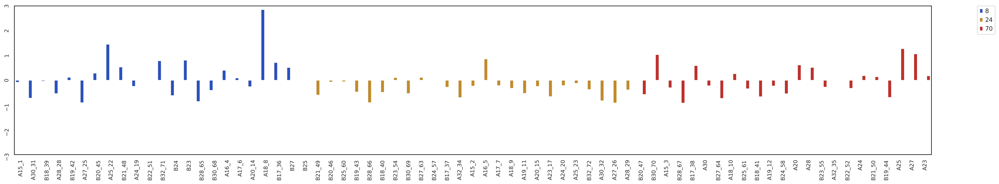

In [114]:
sns.set_style('white')
fig, axes = plt.subplots(figsize=(30,5))
axes.set_ylim([-3, 3])
axes.tick_params(labelsize=10,labelrotation=90)
sns.barplot(x=merged_gene_df_z_sum.index, y=0, hue='timepoint', data=merged_gene_df_z_sum, order=None, hue_order=[8,24,70],palette=color_map_timepoints)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
axes.set_ylabel("")
axes.set_xlabel("")


In [120]:
merged_gene_df_z_sum.groupby(['timepoint']).median()

,0
timepoint,
8,0.021900
24,-0.323309
70,-0.220985


In [18]:
#flatten dataframe for plotting
merged_gene_df['patient']= merged_gene_df.index.str.slice(stop=3)
merged_gene_df_flat = merged_gene_df.melt(id_vars=['timepoint','patient'])
merged_gene_df_flat

,timepoint,patient,variable,value
0,8,A15,KIR2DL4,537.00
1,8,A30,KIR2DL4,563.05
2,8,B18,KIR2DL4,512.50
3,8,A28,KIR2DL4,144.05
4,8,B19,KIR2DL4,609.00
...,...,...,...,...
918,70,B21,NCR2,43.40
919,70,B19,NCR2,14.20
920,70,A25,NCR2,12.50
921,70,A27,NCR2,24.50


In [19]:
#set params
sns.set(font_scale=1)
sns.set_style('white')
line_weight = 2
subplot_coordinate_list=[(0,0),(0,1),(0,2),(0,3),(0,4),(0,5),(1,0),(1,1),(1,2),(1,3),(1,4),(1,5),(2,0),(2,1),(2,2),(2,3),(2,4),(2,5),(3,0),(3,1),(3,2),(3,3),(3,4),(3,5),(4,0),(4,1),(4,2),(4,3),(4,4),(4,5),
                         (5,0),(5,1),(5,2),(5,3),(5,4),(5,5)]
fig, axs = plt.subplots(6, 6, figsize=(30,30), sharey=False)

#plot
for j,i in enumerate(set(merged_gene_df_flat['variable'])):
    merged_gene_df_flat_subset = merged_gene_df_flat[merged_gene_df_flat['variable']==i]
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='A15'],linewidth=line_weight, linestyle='-',marker='o', color=patient_color_list[0])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='A30'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[1])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='B18'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[2])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='A28'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[3])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='B19'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[4])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='A27'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[5])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='B20'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[6])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='A25'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[7])
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=merged_gene_df_flat_subset[merged_gene_df_flat_subset['patient']=='B21'],linewidth=line_weight,linestyle='-',marker='o', color=patient_color_list[8])

 
    axs[subplot_coordinate_list[j]].set_title(i)

In [ ]:
#zscore

merged_gene_z_df = pd.DataFrame(scipy.stats.zscore(merged_gene_df,axis=1), columns= merged_gene_df.columns, index=merged_gene_df.index)
merged_gene_z_df

In [374]:
#calculate mean expression in microarray
mean_probes_merged = np.mean(merged_gene_z_df)

In [375]:
TCGA_no_nan_primarymean_probes_merged.to_csv('/home/thomas/Jupyter/2020_PAAD_Peng_Sun_preprocessing/CD56bright_sig_scores.csv')

SpearmanrResult(correlation=0.17007425272381363, pvalue=0.09407788233581106)


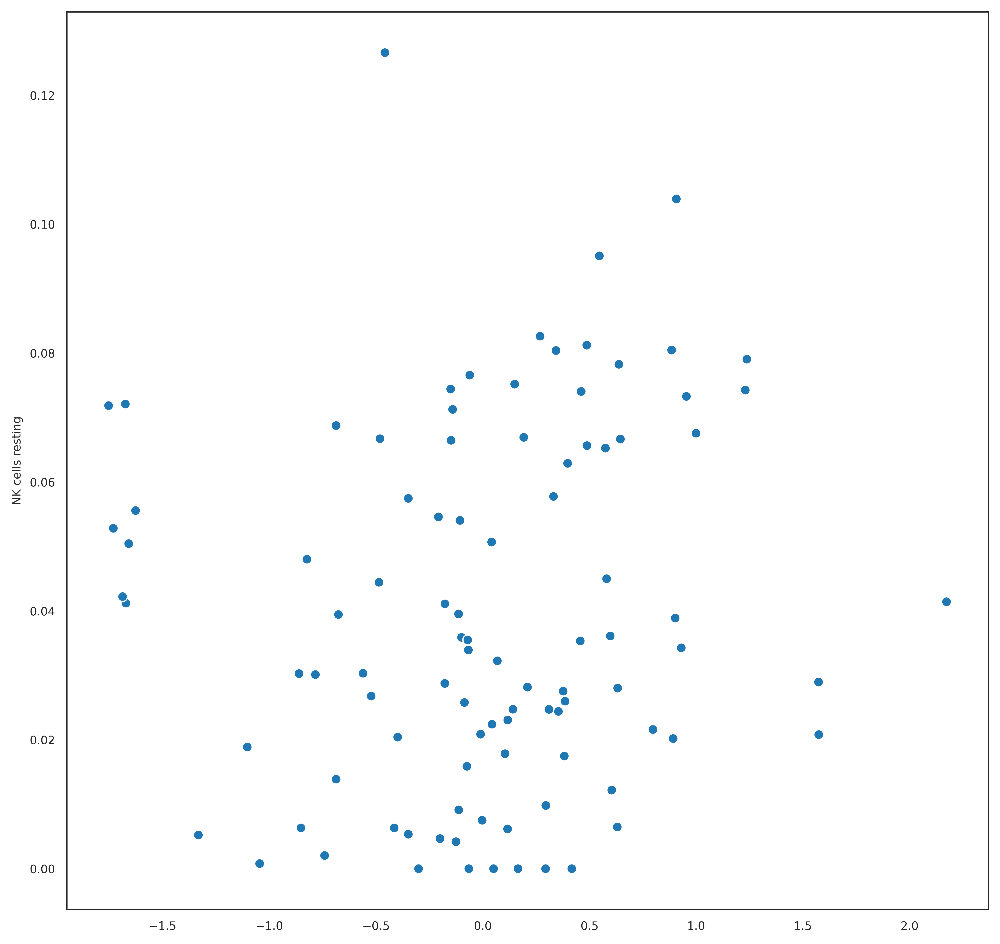

In [376]:
corr_1 = mean_probes_merged
corr_2 = CIBERSORT_df.loc[:,'NK cells resting']
sns.scatterplot(x=corr_1, y=corr_2)
print(scipy.stats.spearmanr(corr_1, b=corr_2, axis=0, nan_policy='propagate'))

CD44 SpearmanrResult(correlation=-0.09560002730960153, pvalue=0.3490692350419462)
CXCR3 SpearmanrResult(correlation=0.34287882402543557, pvalue=0.0005479098197417732)
RPL36A SpearmanrResult(correlation=0.26554783814684624, pvalue=0.008225142898918389)
GZMK SpearmanrResult(correlation=0.3921379858448728, pvalue=6.515131538020988e-05)
PPP1R14B SpearmanrResult(correlation=-0.20394825030001215, pvalue=0.043977604798982876)


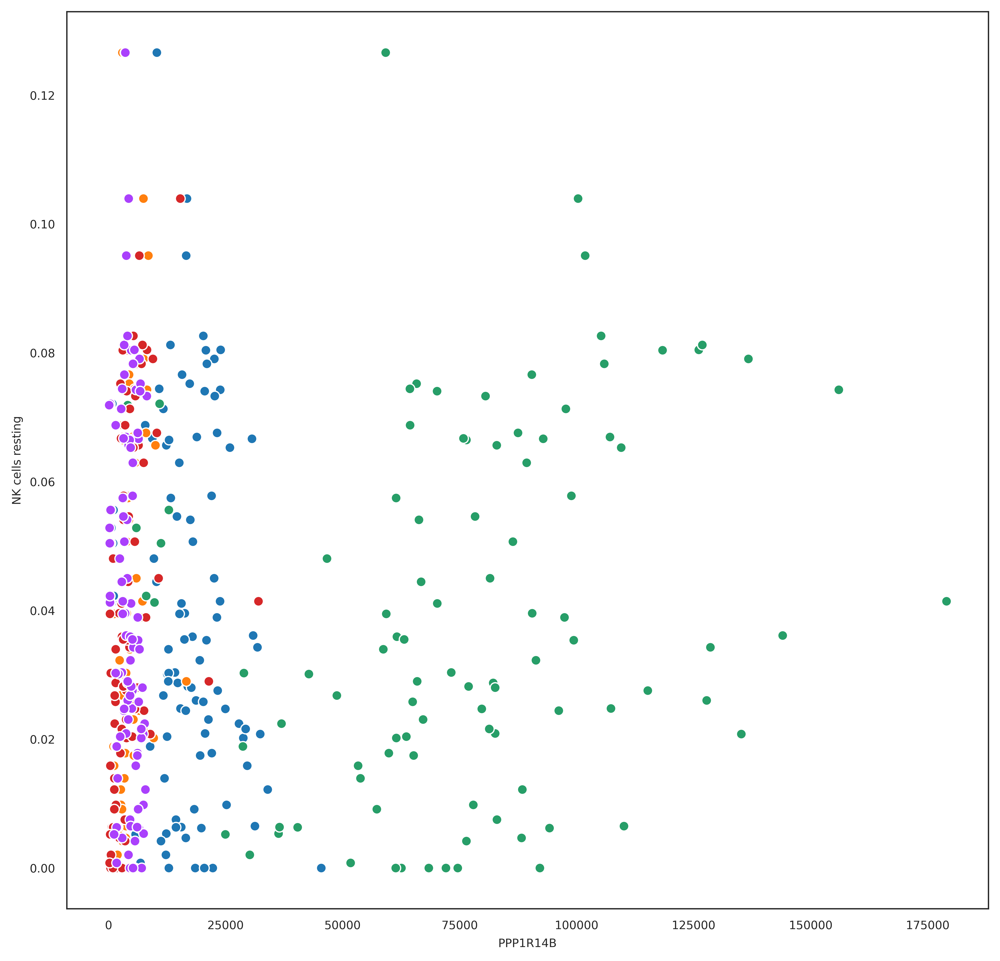

In [377]:

corr_2 = CIBERSORT_df.loc[:,'NK cells resting']

for i in merged_gene_df.index:
    corr_1 = merged_gene_df.loc[i]
    sns.scatterplot(x=corr_1, y=corr_2)
    print(i, scipy.stats.spearmanr(corr_1, b=corr_2, axis=0, nan_policy='propagate'))

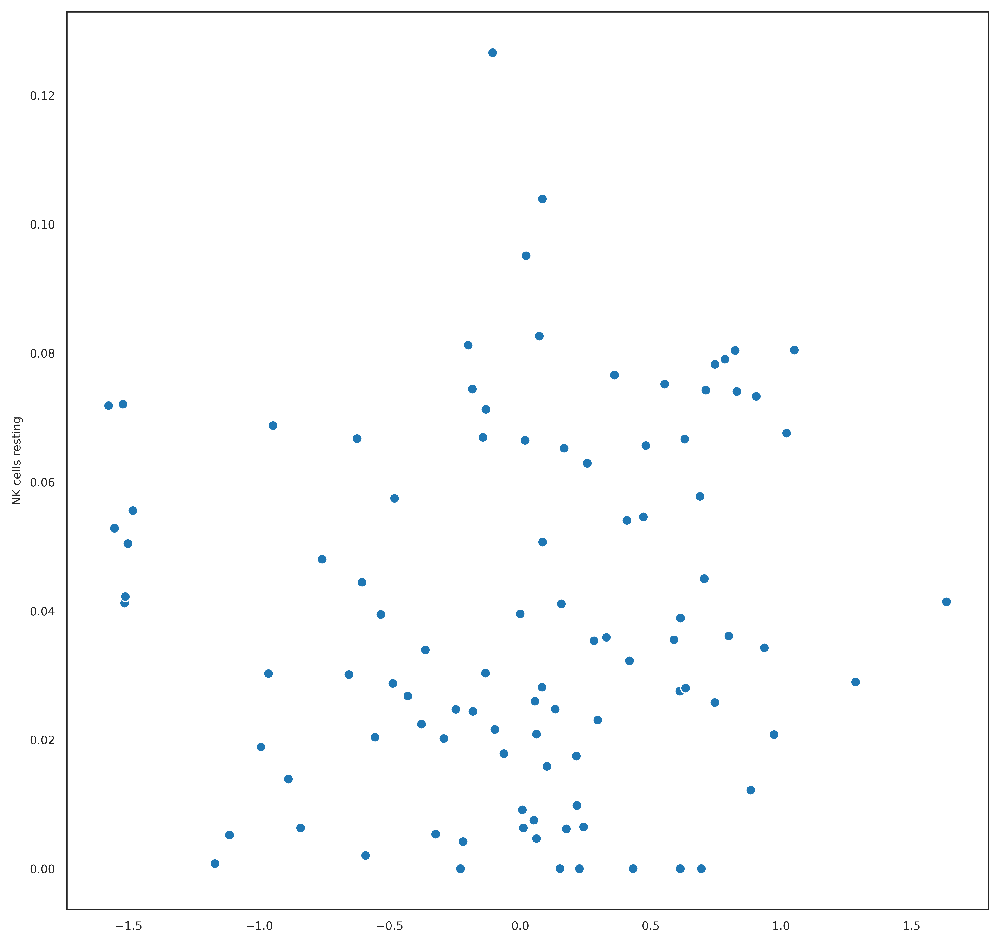

In [349]:
sns.scatterplot(x=mean_probes_merged, y=corr_2)